# Clasificación case_1: SARM

In [191]:
# Importación de librerías
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import numpy as np
import networkx as nx

from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from imblearn.over_sampling import SMOTENC
from sklearn.feature_selection import VarianceThreshold, RFE
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, make_scorer
from scipy.stats import shapiro, f_oneway, friedmanchisquare
from sklearn.tree import plot_tree, _tree
from scikit_posthocs import posthoc_dunn

In [192]:
# Cargo el dataset
#data = pd.read_csv(r'C:\Users\nfersob\OneDrive - BAHIA SOFTWARE SL\TFM\Código\Preprocesado\dt_unificado1_2.csv', delimiter=';')
data = pd.read_csv(r'/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/Preprocesado/dt_unificado1_2.csv', delimiter=';')
print(data.shape[1])
print(f'Datos de la columna admission_location: {data["admission_location"].value_counts()}')

47
Datos de la columna admission_location: admission_location
EMERGENCY ROOM ADMIT         791
CLINIC REFERRAL/PREMATURE    625
TRANSFER FROM HOSP/EXTRAM    334
PHYS REFERRAL/NORMAL DELI    170
TRANSFER FROM SKILLED NUR     21
TRANSFER FROM OTHER HEALT     13
Name: count, dtype: int64


# División de los datos en train y test

In [193]:
# Guardo la variable de los casos
case_1 = data['case_1']
case_2 = data['case_2']
id_paciente = data['id_paciente']
exitus = data['exitus']

# Modifico la variable case para que yes = 1 y no = 0
case_1 = case_1.map({'yes':1, 'no':0})
case_2 = case_2.map({'yes':1, 'no':0})

# Separo las características en variables y respuesta
variables_eliminar = ['case_1', 'case_2', 'exitus', 'id_paciente']
variables = data.drop(columns=variables_eliminar)
respuesta = case_1
print(respuesta.value_counts())

# Hold-Out con estratificación para mantener las proporciones
X_train, X_test, y_train, y_test = train_test_split(variables, respuesta, test_size=0.2, stratify=respuesta, random_state=789)
# X_train son los datos del dataset 'variables' que se usan para entrenamiento (80%)
# y_train son los datos del dataset 'respuesta' que se usan para entrenamiento (80%)
# X_test son los datos del dataset 'variables' que se usan para el test (20%)
# y_test son los datos del dataset 'respuesta' que se usan para el test (20%)

# Compruebo las proporciones para ver si la división de los conjuntos es correcta
print(f'\nProporción de datos originales: {respuesta.value_counts(normalize=True)}')
print(f'\nProporción de datos del entrenamiento: {y_train.value_counts(normalize=True)}')
print(f'\nProporción de datos del test: {y_test.value_counts(normalize=True)}')



case_1
1    1472
0     482
Name: count, dtype: int64

Proporción de datos originales: case_1
1    0.753327
0    0.246673
Name: proportion, dtype: float64

Proporción de datos del entrenamiento: case_1
1    0.753039
0    0.246961
Name: proportion, dtype: float64

Proporción de datos del test: case_1
1    0.754476
0    0.245524
Name: proportion, dtype: float64


# One-Hot Encoding

In [194]:
# Separación en variables numéricas y variables categóricas
numeric_features = ['elixhauser_score_ahrq_vanwalraven','elixhauser_score_ahrq_sid29','elixhauser_score_ahrq_sid30','elixhauser_score_quan_vanwalraven','elixhauser_score_quan_sid29',
                    'elixhauser_score_quan_sid30','sofa','qsofa','saps','sapsii','sapsii_prob','apsiii','apsiii_prob','patient_age','hours_between_admission_and_first_icu',
                    'hours_in_icu_in_previous_admissions','hours_in_icu_in_previous_admissions_and_the_current_one','number_of_colonizations_in_the_current_admission']

categorical_features = ['patient_gender', 'previous_colonization_with_enterobacterales_cre','previous_colonization_with_pseudomonas_aeruginosa','previous_colonization_with_acinetobacter_baumannii',
                        'previous_colonization_with_sarm','previous_colonization_with_stenotrophomonas_maltophilia','previous_colonization_with_erv','previous_exposure_to_third_generation_cephalosporins',
                        'previous_exposure_to_carbapenems','previous_exposure_to_fluorquinolones','previous_exposure_to_aminoglycosides','previous_exposure_to_b_lactam','previous_exposure_to_antifungal_agents',
                        'previous_exposure_to_glycopeptides','mechanical_ventilation_in_previous_admissions','mechanical_ventilation_in_the_current_admission','organ_transplant_in_previous_admissions',
                        'organ_transplant_in_the_current_admission','hematopoietic_transplant_in_previous_admissions','hematopoietic_transplant_in_the_current_admission','catheter_in_previous_admissions',
                        'catheter_in_the_current_admission','readmission','admission_type', 'admission_location']

X_train_categorica = X_train[categorical_features]
X_train_numerica = X_train[numeric_features]

X_test_categorica = X_test[categorical_features]
X_test_numerica = X_test[numeric_features]

# Aplico One-Hot Encoding solo a las variables categóricas
encoder = OneHotEncoder(drop = 'if_binary', sparse_output = False) 
# drop ='if_binary' se pone porque las catergorias yes/no solo aparezca un valor (si no es yes, es no)
# sparse_output = False no se si hace falta
X_train_categorical_encoded = encoder.fit_transform(X_train_categorica)
X_test_categorical_encoded = encoder.fit_transform(X_test_categorica)

# Convierto los array en dataframes
X_train_categorical_encoded_df = pd.DataFrame(X_train_categorical_encoded, columns=encoder.get_feature_names_out(X_train_categorica.columns))
X_test_categorical_encoded_df = pd.DataFrame(X_test_categorical_encoded, columns=encoder.get_feature_names_out(X_test_categorica.columns))

# Reseteo los índices para evitar problemas en la concatenación
X_train_categorical_encoded_df.reset_index(drop = True, inplace=True)
X_test_categorical_encoded_df.reset_index(drop=True, inplace=True)
X_train_numerica.reset_index(drop=True, inplace=True)
X_test_numerica.reset_index(drop=True, inplace=True)

# Concateno el DataFrame de variables numericas y categóricas transformadas
X_train = pd.concat([X_train_numerica, X_train_categorical_encoded_df], axis=1)
X_test = pd.concat([X_test_numerica, X_test_categorical_encoded_df], axis=1)

print(X_train.shape[1])
print(X_test.shape[1])

50
50


# Balanceo de los datos de entrenamiento

Proporción de datos originales:  case_1
1    0.753327
0    0.246673
Name: proportion, dtype: float64

Proporción de datos de entrenamiento:  case_1
1    0.5
0    0.5
Name: proportion, dtype: float64

Proporción de datos del test:  case_1
1    0.754476
0    0.245524
Name: proportion, dtype: float64


/var/folders/nx/wpp8g04n0zxcrg173jwb2cjr0000gn/T/ipykernel_66115/2957383235.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes.set_xticklabels(etiquetas)


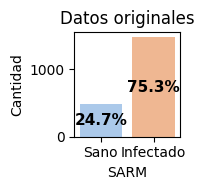

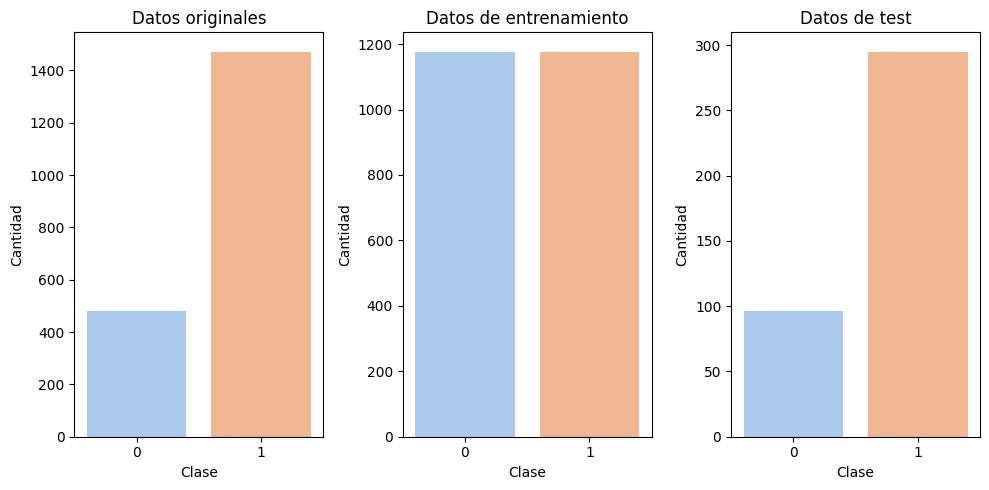

In [216]:
# Determino cuales son las columnas con variables categóricas
categorical_encoded_columns = encoder.get_feature_names_out(X_train_categorica.columns)
# Saco los indices para indicarlo en SMOTENC
categorical_indices = []
for col in categorical_encoded_columns:
    categorical_indices.append(X_train.columns.get_loc(col))

# Aplico SMOTENC
smote_nc = SMOTENC(categorical_features=categorical_indices, random_state=789)
X_train, y_train = smote_nc.fit_resample(X_train, y_train)

# Proporción de cómo quedan los datos depués del balanceo en el entrenamiento
print('Proporción de datos originales: ', respuesta.value_counts(normalize=True))
print('\nProporción de datos de entrenamiento: ', y_train.value_counts(normalize=True))
print('\nProporción de datos del test: ', y_test.value_counts(normalize=True))


# Representación gráfica solo para los datos originales
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(2, 2))

etiquetas = ['Sano', 'Infectado']
total = len(respuesta)

# Crear el gráfico
sns.countplot(x=respuesta, hue=respuesta, ax=axes, palette='pastel', legend=False)

# Personalizar ejes
axes.set_title('Datos originales')
axes.set_xlabel('SARM')
axes.set_ylabel('Cantidad')
axes.set_xticklabels(etiquetas)

# Añadir porcentaje en el centro de cada barra
for p in axes.patches:
    height = p.get_height()
    porcentaje = f'{100 * height / total:.1f}%'
    axes.annotate(porcentaje,
                  (p.get_x() + p.get_width() / 2., height / 2),
                  ha='center', va='center', fontsize=11, color='black', fontweight='bold')

plt.tight_layout()
plt.show()

# Representación gráfica de antes y después del balanceo de los datos
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,5))

etiqueta = ['Sano', 'Infectado']

# Para respuesta
sns.countplot(x=respuesta, hue=respuesta, ax=axes[0], palette='pastel', legend=False)
axes[0].set_title('Datos originales')
axes[0].set_xlabel('Clase')
axes[0].set_ylabel('Cantidad')

# Para los datos de entrenamiento
sns.countplot(x=y_train, hue=y_train, legend=False, ax=axes[1], palette='pastel')
axes[1].set_title('Datos de entrenamiento')
axes[1].set_xlabel('Clase')
axes[1].set_ylabel('Cantidad')

# Para los datos de test
sns.countplot(x=y_test, hue=y_test, legend=False, ax=axes[2], palette='pastel')
axes[2].set_title('Datos de test')
axes[2].set_xlabel('Clase')
axes[2].set_ylabel('Cantidad')

plt.tight_layout()
plt.show()

# Estudio de la normalidad

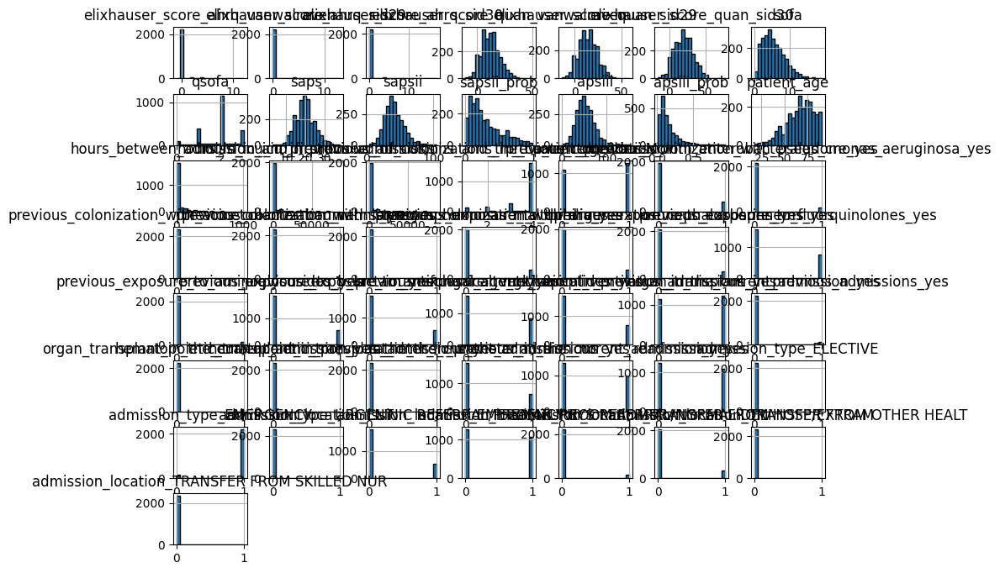

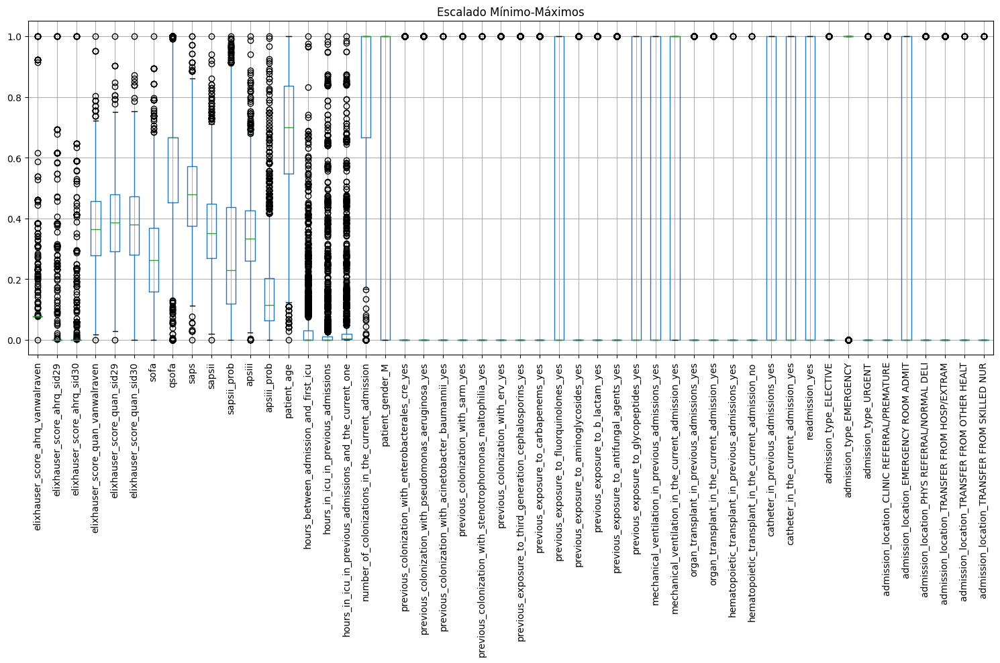

In [196]:
X_train.hist(figsize=(10,8), bins=20, edgecolor='black')

# Hago escalado por minimo-maximo al no haber normalidad en la mayoría de variables
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Convertir a DataFrame
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Representación después del escalado
plt.figure(figsize=(15,10))
X_train_scaled_df.boxplot(rot=90)
plt.title('Escalado Mínimo-Máximos')
plt.tight_layout()
plt.show()

# Selección de características

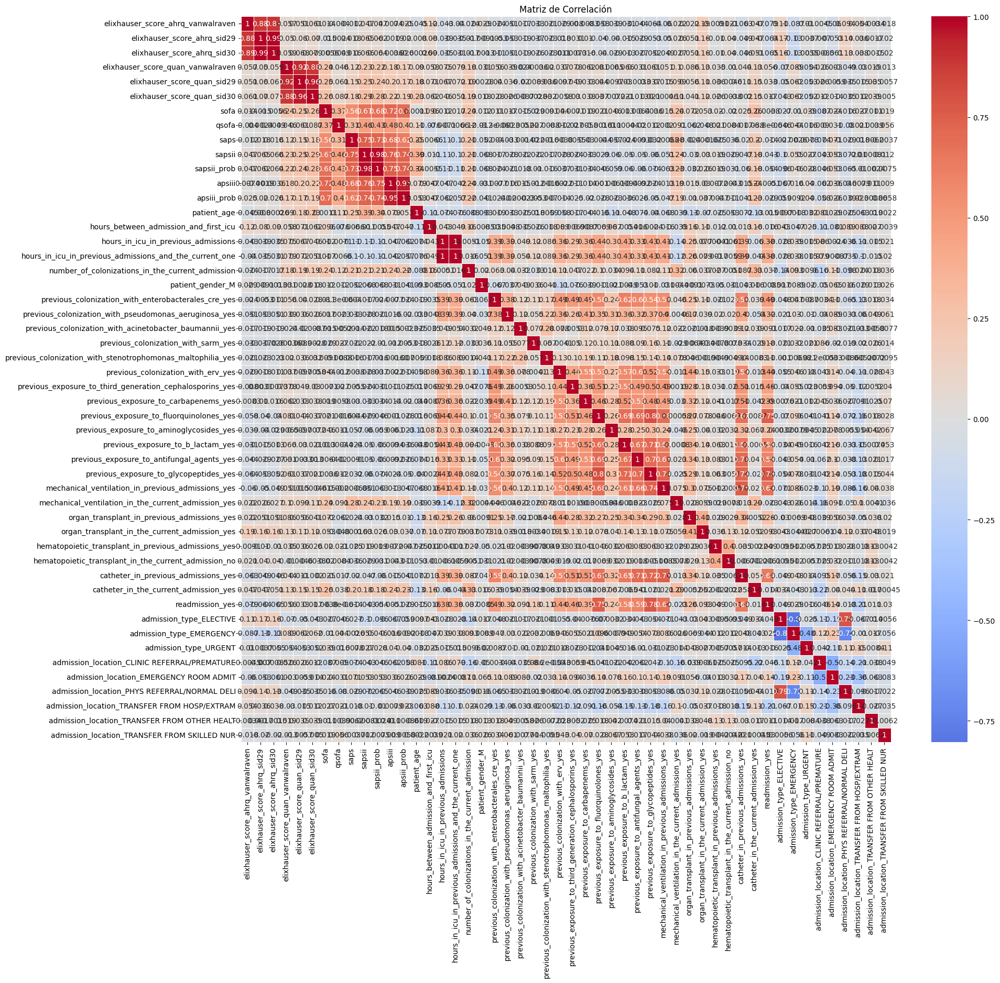

In [197]:
corr_matrix = X_train.corr()
plt.figure(figsize=(20,18))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5), # Con True para ver los valores

plt.title("Matriz de Correlación")
plt.show()

In [198]:
# Calcular la matriz de correlación
corr_matrix = X_train.corr().abs()  # Valor absoluto para detectar correlaciones fuertes, positivas o negativas

# Extraer la parte superior del triángulo (para evitar duplicados)
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Columnas a eliminar: aquellas que tienen alguna correlación > 0.85 en la parte superior
cols_to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.85)]

print("Columnas eliminadas por alta correlación:")
print(cols_to_drop)

X_train_filtered = X_train.drop(columns=cols_to_drop)
X_test_filtered = X_test.drop(columns=cols_to_drop)

#_train = X_train_filtered
X_test = X_test_filtered

Columnas eliminadas por alta correlación:
['elixhauser_score_ahrq_sid29', 'elixhauser_score_ahrq_sid30', 'elixhauser_score_quan_sid29', 'elixhauser_score_quan_sid30', 'sapsii_prob', 'apsiii_prob', 'hours_in_icu_in_previous_admissions_and_the_current_one']


In [199]:
# Para no tener problema con el nombre de las columnas al trabajar con array o dataframe
#X_train_columnas = X_train
#X_test_columnas = X_test

# Parámetros del selector de características (VarianceThreshold)
#selector = VarianceThreshold(threshold=(.8 * (1- .8))) # aprox 0.16, útil para casos de variables desbalanceadas
# con este umbral se eliminarán las variables binarias que sean 1 o 0 en más del 80% de los casos

# Ajusto y transformo sobre X_train y solo transformo sobre X_test
#X_train = selector.fit_transform(X_train)
#X_test = selector.transform(X_test)

# Convierto los arrays en DataFrame
#X_train = pd.DataFrame(X_train, columns=X_train_columnas.columns[selector.get_support()])
#X_test = pd.DataFrame(X_test, columns=X_test_columnas.columns[selector.get_support()])

# Número de características y qué características
print(X_train.shape[1])
print(X_train.columns)

50
Index(['elixhauser_score_ahrq_vanwalraven', 'elixhauser_score_ahrq_sid29',
       'elixhauser_score_ahrq_sid30', 'elixhauser_score_quan_vanwalraven',
       'elixhauser_score_quan_sid29', 'elixhauser_score_quan_sid30', 'sofa',
       'qsofa', 'saps', 'sapsii', 'sapsii_prob', 'apsiii', 'apsiii_prob',
       'patient_age', 'hours_between_admission_and_first_icu',
       'hours_in_icu_in_previous_admissions',
       'hours_in_icu_in_previous_admissions_and_the_current_one',
       'number_of_colonizations_in_the_current_admission', 'patient_gender_M',
       'previous_colonization_with_enterobacterales_cre_yes',
       'previous_colonization_with_pseudomonas_aeruginosa_yes',
       'previous_colonization_with_acinetobacter_baumannii_yes',
       'previous_colonization_with_sarm_yes',
       'previous_colonization_with_stenotrophomonas_maltophilia_yes',
       'previous_colonization_with_erv_yes',
       'previous_exposure_to_third_generation_cephalosporins_yes',
       'previous_exposu

In [200]:
modelo_base = LogisticRegression(solver='liblinear')
rfe = RFE(estimator=modelo_base, n_features_to_select=1)
rfe.fit(X_train, y_train)

# Mostrar ranking completo (menor = más importante)
ranking_dict = {col: rank for col, rank in zip(X_train.columns, rfe.ranking_)}
ranking_ordenado = sorted(ranking_dict.items(), key=lambda x: x[1])

# Quedarse con los nombres de las 25 primeras
mejores_25 = [col for col, rank in ranking_ordenado[:25]]
print("Top 25 características seleccionadas:")
print(mejores_25)

X_train_top25 = X_train[mejores_25]
X_test_top25 = X_test[mejores_25]

X_train = X_train_top25
X_test = X_test_top25

Top 25 características seleccionadas:
['previous_colonization_with_erv_yes', 'admission_location_CLINIC REFERRAL/PREMATURE', 'admission_location_PHYS REFERRAL/NORMAL DELI', 'admission_location_TRANSFER FROM HOSP/EXTRAM', 'admission_location_EMERGENCY ROOM ADMIT', 'admission_location_TRANSFER FROM OTHER HEALT', 'apsiii_prob', 'admission_location_TRANSFER FROM SKILLED NUR', 'previous_colonization_with_acinetobacter_baumannii_yes', 'admission_type_ELECTIVE', 'previous_colonization_with_sarm_yes', 'mechanical_ventilation_in_previous_admissions_yes', 'catheter_in_the_current_admission_yes', 'admission_type_URGENT', 'previous_colonization_with_stenotrophomonas_maltophilia_yes', 'hematopoietic_transplant_in_previous_admissions_yes', 'previous_exposure_to_antifungal_agents_yes', 'organ_transplant_in_previous_admissions_yes', 'previous_exposure_to_aminoglycosides_yes', 'previous_colonization_with_pseudomonas_aeruginosa_yes', 'hematopoietic_transplant_in_the_current_admission_no', 'previous_expo

KeyError: "['apsiii_prob'] not in index"

# Modelos de clasificación
Los hiperparámetros de los modelos de clasificación primero fueron obtenidos todos haciendo GridSearch con una cv=10, teniendo en cuenta el valor de AUC. El código para utilizar GridSearch aparece abajo y está comentado (con '#' para que no se corra el pulsar 'Run All')

In [ ]:
pesos = {0:2, 1:1}
#svm_base = LinearSVC(random_state=789, loss='squared_hinge', C=2, #1, class_weight=pesos, max_iter=500)

modelos = {
    'Random Forest': RandomForestClassifier(n_estimators=500, #1500,
                                            max_depth=20, #15,
                                            max_features='log2', #'sqrt',
                                            bootstrap=False, #True, 
                                            criterion='gini', #'entropy',
                                            class_weight='balanced', #pesos,
                                            random_state=789),

    'AdaBoost': AdaBoostClassifier(algorithm='SAMME',
                                   n_estimators=1500, #200,
                                   learning_rate=1.5, #0.1,
                                   random_state=789),

    'LogisticRegression': LogisticRegression(max_iter = 8000,
                                             n_jobs=-1,
                                             random_state=789,
                                             C=10, #0.1,
                                             class_weight='balanced',
                                             fit_intercept=True,
                                             penalty='l1',#'l2',
                                             solver='liblinear'),#'lbfgs'),

    'Extra Trees': ExtraTreesClassifier(random_state=789,
                                        n_estimators=1000, #500,
                                        max_depth=None, #10,
                                        criterion='entropy', #'gini',
                                        bootstrap=False, #True,
                                        max_features='log2'),#'sqrt'),
    
    'K Vecinos': KNeighborsClassifier(algorithm='auto',
                                      n_neighbors=5,
                                      p=1,
                                      weights='distance'),
    
    #'SVM Lineal (Calibrated)': CalibratedClassifierCV(estimator=svm_base),

    'Gradient Boosting': GradientBoostingClassifier(random_state=789,
                                                    loss='log_loss',
                                                    learning_rate=0.05,
                                                    n_estimators=500,
                                                    subsample=0.5,
                                                    criterion='friedman_mse',
                                                    max_depth=10, #15,
                                                    max_features='sqrt'),

    'XGBoost': XGBClassifier(random_state=789,
                             n_estimators=500, #100,
                             learning_rate=0.05,
                             max_depth=10,
                             gamma=0, #0.1,
                             min_child_weight=1,
                             subsample=0.8,
                             colsample_bytree=0.8, #1,
                             reg_alpha=0.01, #1,
                             reg_lambda=0.1), #1),
    
    #'Decision Tree': DecisionTreeClassifier(random_state=789,criterion='gini',splitter='best',max_depth=10,max_features='sqrt',class_weight=pesos)
}

modelos['VotingClassifier'] = VotingClassifier(estimators=[
    ('rf', modelos['Random Forest']),
    #('adaboost', modelos['AdaBoost']),
    ('logreg', modelos['LogisticRegression']),
    ('extratree', modelos['Extra Trees']),
    #('kvecinos', modelos['K Vecinos']),
    #('svm', modelos['SVM Lineal (Calibrated)']),
    ('gradboost', modelos['Gradient Boosting']),
    ('xgboost', modelos['XGBoost']),
    #('decisiontree', modelos['Decision Tree'])
], voting='soft',
n_jobs=-1)

# Métricas de evaluación

In [ ]:
# Función para calcular la especificidad (TN / (TN + FP))
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp) if (tn + fp) != 0 else 0

# Scorer personalizado para usar en cross_validate
specificity = make_scorer(specificity_score)

# Donde se almacenarán los resultados
resumenes = []
df_todos_folds = pd.DataFrame()

# Evaluación de cada modelo
for nombre, modelo in modelos.items():
    resultados_cv = cross_validate(
        modelo,
        X_train,
        y_train,
        scoring={
            "accuracy": "accuracy",
            "precision": "precision",
            "recall": "recall",
            "f1": "f1",
            "specificity": specificity,
            "roc_auc": "roc_auc"
        },
        cv=10,
        return_train_score=False
    )

    # Resultados por fold
    df_folds = pd.DataFrame(resultados_cv)
    df_folds["Modelo"] = nombre

    # Acumulamos todos los folds de todos los modelos
    df_todos_folds = pd.concat([df_todos_folds, df_folds], ignore_index=True)

    # Guardamos resultados individuales por modelo
    nombre_archivo = f"resultados_folds_{nombre.replace(' ', '_')}.csv"
    df_folds.to_csv(nombre_archivo, index=False)

    # Imprimimos métricas por fold
    print(f"\n\nResultados de {nombre}:")
    for i in range(len(df_folds)):
        print(f"Fold {i + 1}:")
        print(f"- Accuracy    : {df_folds.loc[i, 'test_accuracy']:.3f}")
        print(f"- Precision   : {df_folds.loc[i, 'test_precision']:.3f}")
        print(f"- Recall      : {df_folds.loc[i, 'test_recall']:.3f}")
        print(f"- Specificity : {df_folds.loc[i, 'test_specificity']:.3f}")
        print(f"- F1 Score    : {df_folds.loc[i, 'test_f1']:.3f}")
        print(f"- AUC         : {df_folds.loc[i, 'test_roc_auc']:.3f}")

    # Resumen de métricas promedio y desviación estándar
    resumen = {
        "Modelo": nombre,
        "Accuracy_mean": df_folds["test_accuracy"].mean(),
        "Accuracy_std": df_folds["test_accuracy"].std(),
        "Precision_mean": df_folds["test_precision"].mean(),
        "Precision_std": df_folds["test_precision"].std(),
        "Recall_mean": df_folds["test_recall"].mean(),
        "Recall_std": df_folds["test_recall"].std(),
        "Specificity_mean": df_folds["test_specificity"].mean(),
        "Specificity_std": df_folds["test_specificity"].std(),
        "F1_mean": df_folds["test_f1"].mean(),
        "F1_std": df_folds["test_f1"].std(),
        "AUC_mean": df_folds["test_roc_auc"].mean(),
        "AUC_std": df_folds["test_roc_auc"].std()
    }
    resumenes.append(resumen)

    # Imprimir resumen por modelo
    print(f"\nResumen de {nombre}:")
    print(f"Accuracy    : {resumen['Accuracy_mean']:.3f} ± {resumen['Accuracy_std']:.3f}")
    print(f"Precision   : {resumen['Precision_mean']:.3f} ± {resumen['Precision_std']:.3f}")
    print(f"Recall      : {resumen['Recall_mean']:.3f} ± {resumen['Recall_std']:.3f}")
    print(f"Specificity : {resumen['Specificity_mean']:.3f} ± {resumen['Specificity_std']:.3f}")
    print(f"F1 Score    : {resumen['F1_mean']:.3f} ± {resumen['F1_std']:.3f}")
    print(f"AUC         : {resumen['AUC_mean']:.3f} ± {resumen['AUC_std']:.3f}")

# Guardar resumen final
df_resumen = pd.DataFrame(resumenes)
df_resumen.to_csv("resumen_metricas_modelos.csv", index=False)
df_todos_folds.to_csv("todos_los_folds.csv", index=False)



Resultados de Random Forest:
Fold 1:
- Accuracy    : 0.856
- Precision   : 0.828
- Recall      : 0.898
- Specificity : 0.814
- F1 Score    : 0.862
- AUC         : 0.929
Fold 2:
- Accuracy    : 0.805
- Precision   : 0.773
- Recall      : 0.864
- Specificity : 0.746
- F1 Score    : 0.816
- AUC         : 0.896
Fold 3:
- Accuracy    : 0.788
- Precision   : 0.730
- Recall      : 0.915
- Specificity : 0.661
- F1 Score    : 0.812
- AUC         : 0.907
Fold 4:
- Accuracy    : 0.907
- Precision   : 0.907
- Recall      : 0.907
- Specificity : 0.907
- F1 Score    : 0.907
- AUC         : 0.967
Fold 5:
- Accuracy    : 0.915
- Precision   : 0.971
- Recall      : 0.856
- Specificity : 0.974
- F1 Score    : 0.910
- AUC         : 0.990
Fold 6:
- Accuracy    : 0.906
- Precision   : 0.907
- Recall      : 0.907
- Specificity : 0.906
- F1 Score    : 0.907
- AUC         : 0.975
Fold 7:
- Accuracy    : 0.940
- Precision   : 0.991
- Recall      : 0.890
- Specificity : 0.991
- F1 Score    : 0.938
- AUC      

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and



Resultados de AdaBoost:
Fold 1:
- Accuracy    : 0.729
- Precision   : 0.667
- Recall      : 0.915
- Specificity : 0.542
- F1 Score    : 0.771
- AUC         : 0.836
Fold 2:
- Accuracy    : 0.682
- Precision   : 0.648
- Recall      : 0.797
- Specificity : 0.568
- F1 Score    : 0.715
- AUC         : 0.760
Fold 3:
- Accuracy    : 0.674
- Precision   : 0.620
- Recall      : 0.898
- Specificity : 0.449
- F1 Score    : 0.734
- AUC         : 0.823
Fold 4:
- Accuracy    : 0.860
- Precision   : 0.857
- Recall      : 0.864
- Specificity : 0.856
- F1 Score    : 0.861
- AUC         : 0.941
Fold 5:
- Accuracy    : 0.860
- Precision   : 0.947
- Recall      : 0.763
- Specificity : 0.957
- F1 Score    : 0.845
- AUC         : 0.977
Fold 6:
- Accuracy    : 0.894
- Precision   : 0.935
- Recall      : 0.847
- Specificity : 0.940
- F1 Score    : 0.889
- AUC         : 0.977
Fold 7:
- Accuracy    : 0.915
- Precision   : 0.980
- Recall      : 0.847
- Specificity : 0.983
- F1 Score    : 0.909
- AUC         : 

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 



Resultados de LogisticRegression:
Fold 1:
- Accuracy    : 0.750
- Precision   : 0.752
- Recall      : 0.746
- Specificity : 0.754
- F1 Score    : 0.749
- AUC         : 0.822
Fold 2:
- Accuracy    : 0.691
- Precision   : 0.689
- Recall      : 0.695
- Specificity : 0.686
- F1 Score    : 0.692
- AUC         : 0.779
Fold 3:
- Accuracy    : 0.742
- Precision   : 0.711
- Recall      : 0.814
- Specificity : 0.669
- F1 Score    : 0.759
- AUC         : 0.838
Fold 4:
- Accuracy    : 0.758
- Precision   : 0.748
- Recall      : 0.780
- Specificity : 0.737
- F1 Score    : 0.763
- AUC         : 0.843
Fold 5:
- Accuracy    : 0.745
- Precision   : 0.764
- Recall      : 0.712
- Specificity : 0.778
- F1 Score    : 0.737
- AUC         : 0.830
Fold 6:
- Accuracy    : 0.719
- Precision   : 0.694
- Recall      : 0.788
- Specificity : 0.650
- F1 Score    : 0.738
- AUC         : 0.816
Fold 7:
- Accuracy    : 0.791
- Precision   : 0.817
- Recall      : 0.754
- Specificity : 0.829
- F1 Score    : 0.784
- AUC 

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 



Resultados de VotingClassifier:
Fold 1:
- Accuracy    : 0.839
- Precision   : 0.817
- Recall      : 0.873
- Specificity : 0.805
- F1 Score    : 0.844
- AUC         : 0.924
Fold 2:
- Accuracy    : 0.792
- Precision   : 0.776
- Recall      : 0.822
- Specificity : 0.763
- F1 Score    : 0.798
- AUC         : 0.870
Fold 3:
- Accuracy    : 0.792
- Precision   : 0.732
- Recall      : 0.924
- Specificity : 0.661
- F1 Score    : 0.816
- AUC         : 0.906
Fold 4:
- Accuracy    : 0.903
- Precision   : 0.913
- Recall      : 0.890
- Specificity : 0.915
- F1 Score    : 0.901
- AUC         : 0.961
Fold 5:
- Accuracy    : 0.923
- Precision   : 0.972
- Recall      : 0.873
- Specificity : 0.974
- F1 Score    : 0.920
- AUC         : 0.983
Fold 6:
- Accuracy    : 0.928
- Precision   : 0.924
- Recall      : 0.932
- Specificity : 0.923
- F1 Score    : 0.928
- AUC         : 0.984
Fold 7:
- Accuracy    : 0.945
- Precision   : 1.000
- Recall      : 0.890
- Specificity : 1.000
- F1 Score    : 0.942
- AUC   

# Comparación de modelos

In [ ]:
# Voy a comparar modelos en función de AUC, por lo que el estudio de la normalidad y la comparativa entre modelos para determinar si hay o no 
# diferencias significativas lo hago teniendo en cuenta AUC.

# Con la prueba Shapiro Wilks, si pvalor > 0.05 --> Decimos que no hay suficientes evidencias para rechazar la hipótesis nula de que los datos para
# para AUC siguen una distribución normal. 
# Las hipótesis serían:
# H0: los datos siguen distribución normal
# H1: los datos NO siguen distribución normal

# Me quedo con AUC
modelos_unicos = df_todos_folds['Modelo'].unique()
auc_por_modelo = {}
datos_normales = True # Asumo normalidad

# Estudio la normalidad con el test Shapiro-Wilks
for modelo in modelos_unicos:
    datos = df_todos_folds[df_todos_folds['Modelo'] == modelo] ['test_roc_auc']
    stat, p = shapiro(datos)
    print(f'- {modelo}: p_value por SW para AUC = {p:.3f}')
    auc_por_modelo[modelo] = datos
    if p <= 0.05:
        datos_normales = False

# Tanto ANOVA como el test de Friedman usan el pvalue para determinar si hay o no diferencias entre los modelos
# H0: no hay diferencias significativas
# H1: Hay diferencias significativas
# Si pvalue < 0.05 --> rechazamos H0 y concluimos que hay diferencias significativas en al menos un modelo con los demás
# Si pvalue >= 0.05 --> aceptamos H0 y concluimos que no hay diferencias significativas entre los modelos

if datos_normales:
    print(f'\nSegún el test Shapiro-Wilks, los modelos siguen distribución normal. \nLa comparación de modelos se realiza por un test ANOVA')
    datos_anova = []
    for modelo in modelos_unicos:
        datos_anova.append(auc_por_modelo[modelo])
    stat, p = f_oneway(*datos_anova)
    print(f'Resultado ANOVA: F = {stat:.3f}; p = {p:.3f}')
else:
    print(f'\nAlgún modelo no sigue distribución normal. \nSe aplica test de Friedman para comparar modelos')
    df_todos_folds['fold'] = df_todos_folds.groupby('Modelo').cumcount()

    df_friedman = df_todos_folds.pivot(index='fold', columns='Modelo', values='test_roc_auc')
    datos_friedman = []
    for modelo in modelos_unicos:
        datos_friedman.append(df_friedman[modelo])
    stat, p = friedmanchisquare(*datos_friedman)
    print(f'Resultado test Friedman: F = {stat:.3f}; p = {p:.3f}')

    # Si p < 0.05, se aplican comparaciones múltiples post-hoc
    if p < 0.05:
        print('\nSe detectan diferencias significativas. Se realiza test post-hoc de Dunn con corrección Bonferroni:')
        
        # Convertir a formato largo
        df_long = df_friedman.reset_index().melt(id_vars='fold', var_name='Modelo', value_name='AUC')

        # Test de Dunn
        dunn_results = posthoc_dunn(df_long, val_col='AUC', group_col='Modelo', p_adjust='bonferroni')
        print(dunn_results)
    else:
        print('\nNo se detectan diferencias significativas entre modelos, no se realiza test post-hoc.')

- Random Forest: p_value por SW para AUC = 0.015
- AdaBoost: p_value por SW para AUC = 0.004
- LogisticRegression: p_value por SW para AUC = 0.832
- Extra Trees: p_value por SW para AUC = 0.022
- K Vecinos: p_value por SW para AUC = 0.262
- Gradient Boosting: p_value por SW para AUC = 0.010
- XGBoost: p_value por SW para AUC = 0.011
- VotingClassifier: p_value por SW para AUC = 0.017

Algún modelo no sigue distribución normal. 
Se aplica test de Friedman para comparar modelos
Resultado test Friedman: F = 50.400; p = 0.000

Se detectan diferencias significativas. Se realiza test post-hoc de Dunn con corrección Bonferroni:
                    AdaBoost  Extra Trees  Gradient Boosting  K Vecinos  \
AdaBoost            1.000000     1.000000           1.000000   1.000000   
Extra Trees         1.000000     1.000000           1.000000   1.000000   
Gradient Boosting   1.000000     1.000000           1.000000   1.000000   
K Vecinos           1.000000     1.000000           1.000000   1.000000

# Evaluación de modelos

Evaluación del modelo Random Forest:
- Matriz de confusión: 
 [[ 60  36]
 [ 29 266]]
- Accuracy: 0.834
- Precision: 0.881
- Recall: 0.902
- Specificity: 0.625
- F1 Score: 0.891
- AUC: 0.801


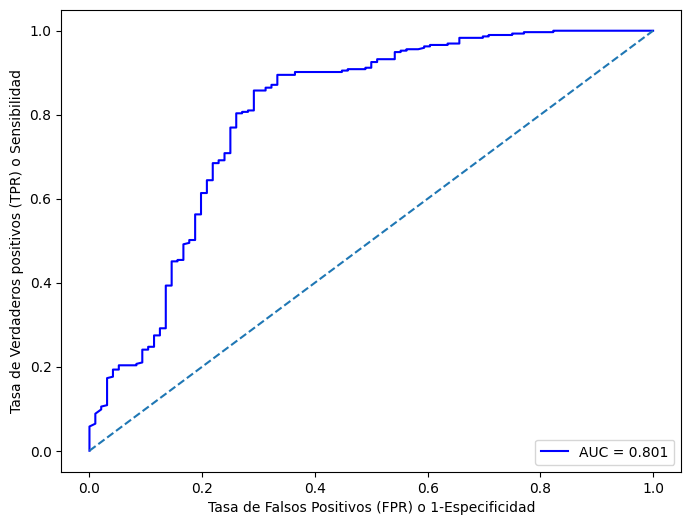

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


Evaluación del modelo AdaBoost:
- Matriz de confusión: 
 [[ 43  53]
 [ 32 263]]
- Accuracy: 0.783
- Precision: 0.832
- Recall: 0.892
- Specificity: 0.448
- F1 Score: 0.861
- AUC: 0.765


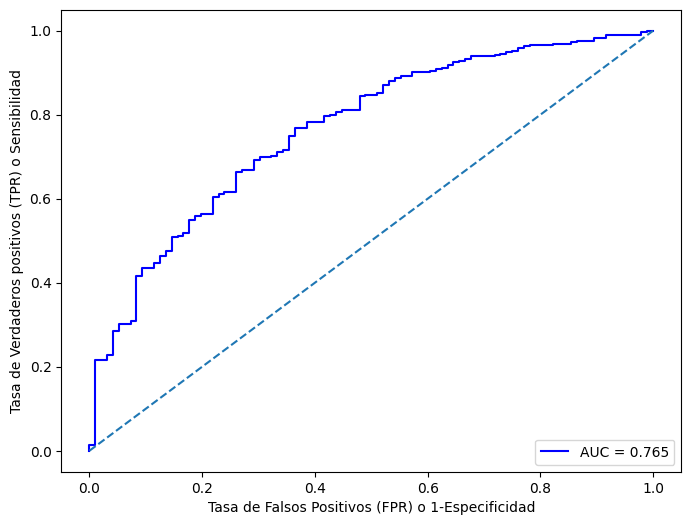

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(


Evaluación del modelo LogisticRegression:
- Matriz de confusión: 
 [[ 64  32]
 [ 57 238]]
- Accuracy: 0.772
- Precision: 0.881
- Recall: 0.807
- Specificity: 0.667
- F1 Score: 0.842
- AUC: 0.785


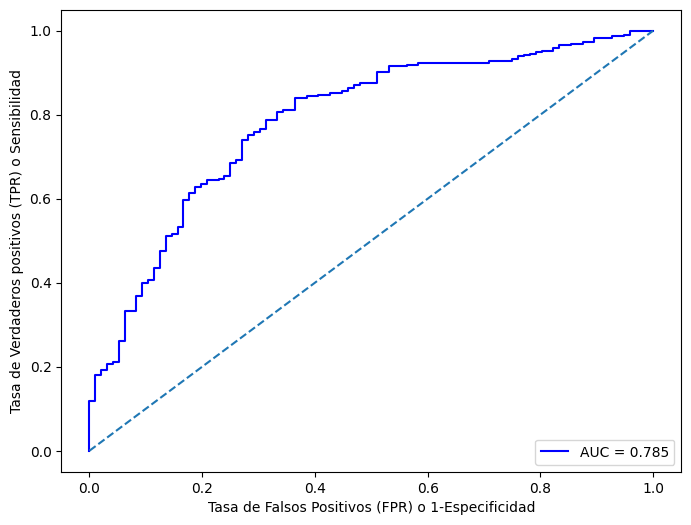

Evaluación del modelo Extra Trees:
- Matriz de confusión: 
 [[ 63  33]
 [ 36 259]]
- Accuracy: 0.824
- Precision: 0.887
- Recall: 0.878
- Specificity: 0.656
- F1 Score: 0.882
- AUC: 0.840


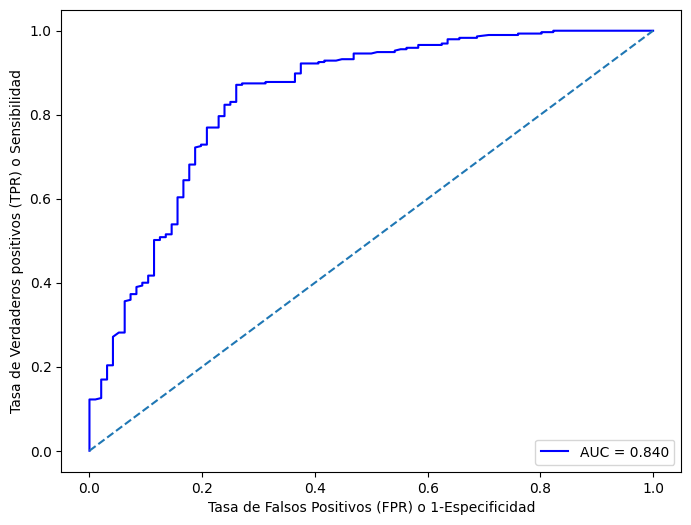

Evaluación del modelo K Vecinos:
- Matriz de confusión: 
 [[ 55  41]
 [ 81 214]]
- Accuracy: 0.688
- Precision: 0.839
- Recall: 0.725
- Specificity: 0.573
- F1 Score: 0.778
- AUC: 0.695


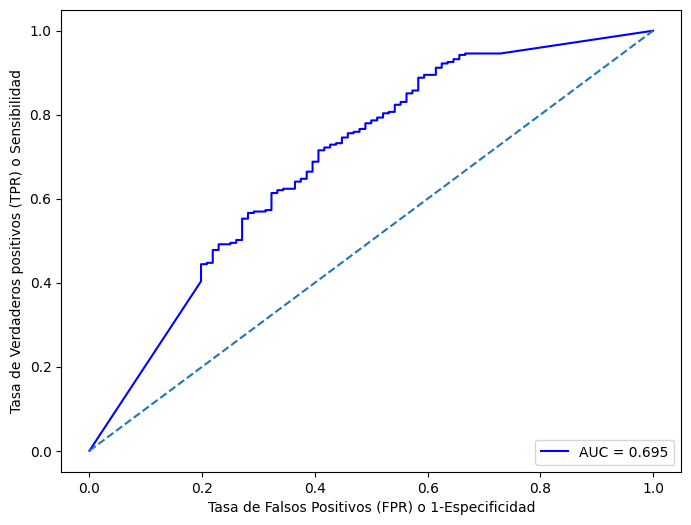

Evaluación del modelo Gradient Boosting:
- Matriz de confusión: 
 [[ 52  44]
 [ 32 263]]
- Accuracy: 0.806
- Precision: 0.857
- Recall: 0.892
- Specificity: 0.542
- F1 Score: 0.874
- AUC: 0.797


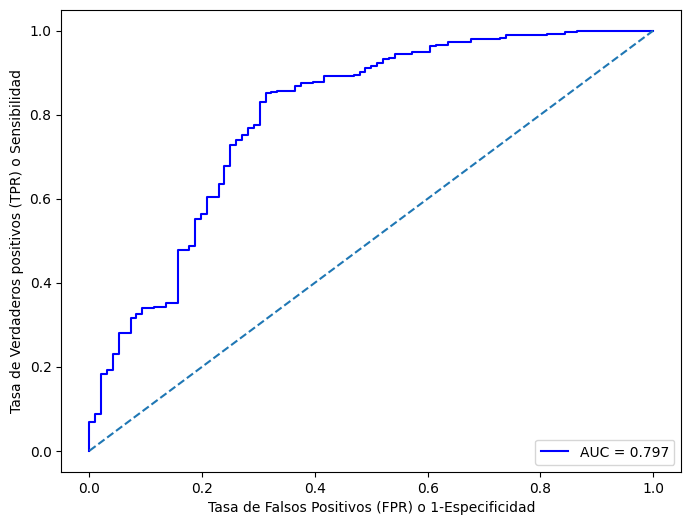

Evaluación del modelo XGBoost:
- Matriz de confusión: 
 [[ 54  42]
 [ 28 267]]
- Accuracy: 0.821
- Precision: 0.864
- Recall: 0.905
- Specificity: 0.562
- F1 Score: 0.884
- AUC: 0.785


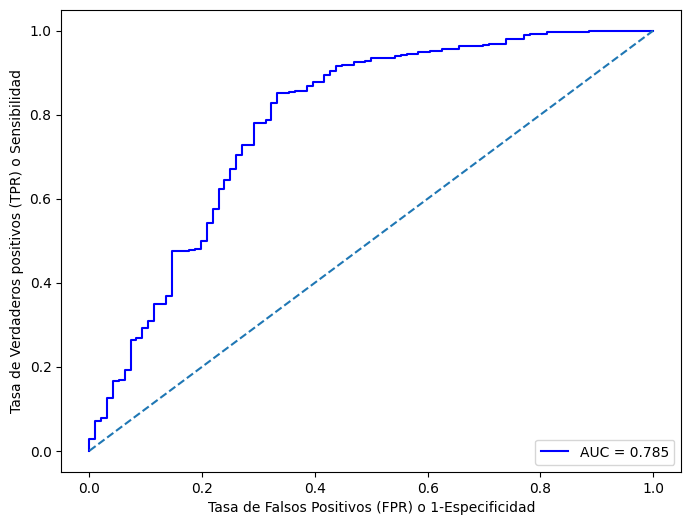

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(


Evaluación del modelo VotingClassifier:
- Matriz de confusión: 
 [[ 59  37]
 [ 27 268]]
- Accuracy: 0.836
- Precision: 0.879
- Recall: 0.908
- Specificity: 0.615
- F1 Score: 0.893
- AUC: 0.821


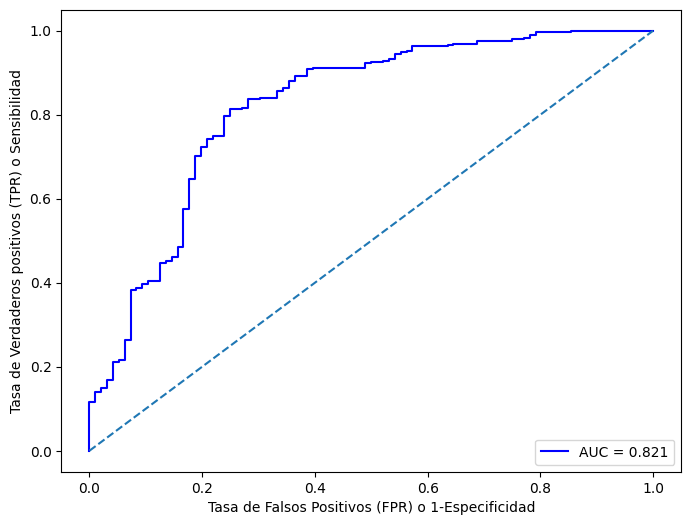

In [ ]:
for nombre, modelo in modelos.items():
    modelo.fit(X_train, y_train)

    # Las predicciones las hago con X_test:
    y_pred = modelo.predict(X_test)
    # Obtengo las probabilidades de la clase positiva (Sano)
    y_pred_prob = modelo.predict_proba(X_test)[:,1]

    # Realizo evaluaciones
    matriz_confusion = confusion_matrix(y_test, y_pred) # tn, fp, fn, tp
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    specificity = specificity_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_prob)

    print(f'Evaluación del modelo {nombre}:')
    print(f'- Matriz de confusión: \n {matriz_confusion}')
    print(f'- Accuracy: {accuracy:.3f}')
    print(f'- Precision: {precision:.3f}')
    print(f'- Recall: {recall:.3f}')
    print(f'- Specificity: {specificity:.3f}')
    print(f'- F1 Score: {f1:.3f}')
    print(f'- AUC: {auc:.3f}')

    # Grafico curva ROC
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc:.3f}')
    plt.plot([0,1], [0,1], linestyle='--') 
    plt.xlabel('Tasa de Falsos Positivos (FPR) o 1-Especificidad')
    plt.ylabel('Tasa de Verdaderos positivos (TPR) o Sensibilidad')
    #plt.title('Curva ROC')
    plt.legend(loc='lower right')
    plt.show()


# Optimización de modelos (de hiperparámetros)

### Random Forest

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'Random Forest'
#modelo = RandomForestClassifier(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'n_estimators': [500, 1000, 1500, 2000],'max_depth': [8, 10, 15, 20],'max_features': ['sqrt', 'log2'],'bootstrap': [True, False],'criterion': ['gini', 'entropy', 'log_loss'],'class_weight': [pesos, 'balanced']}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### AdaBoost

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'AdaBoost'
#modelo = AdaBoostClassifier(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'n_estimators': [50, 100, 200, 500, 1500],'learning_rate': [0.01, 0.1, 1.0, 1.5],'algorithm': ['SAMME', 'SAMME.R']}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Logistic Regression

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'Logistic Regression'
#modelo = LogisticRegression(max_iter=8206, random_state=789, n_jobs=-1)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = [
    #{'C': [0.01, 0.1, 1, 10, 100], 'solver': ['liblinear'], 'penalty': ['l1', 'l2'], 'fit_intercept': [True, False], 'class_weight': [pesos, 'balanced']},
    #{'C': [0.01, 0.1, 1, 10, 100], 'solver': ['lbfgs'], 'penalty': ['l2'], 'fit_intercept': [True, False], 'class_weight': [pesos, 'balanced']},
    #{'C': [0.01, 0.1, 1, 10, 100], 'solver': ['saga'], 'penalty': ['l1', 'l2'], 'fit_intercept': [True, False], 'class_weight': [pesos, 'balanced']},
    #{'C': [0.01, 0.1, 1, 10, 100], 'solver': ['saga'], 'penalty': ['elasticnet'], 'l1_ratio': [0.1, 0.5, 0.9], 'fit_intercept': [True, False], 'class_weight': [pesos, 'balanced']}]

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Extra Trees

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'Extra Trees'
#modelo = ExtraTreesClassifier(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'n_estimators': [100, 300, 500, 1000],'max_depth': [None, 10, 20],'criterion': ['gini', 'entropy', 'log_loss'],'bootstrap': [True, False],'max_features': ['sqrt', 'log2']}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Decision Tree

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'Decision Tree'
#modelo = DecisionTreeClassifier(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'splitter': ['best', 'random'],'max_depth': [5, 10, 15, None],'max_features': ['sqrt', 'log2'],'criterion': ['gini', 'entropy', 'log_loss'],'class_weight': [pesos, 'balanced']}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Discriminante lineal

In [ ]:
# Fijo la semilla globalmente 
#np.random.seed(789)

# El nombre solo es para luego nombrar al modelo
#nombre = 'Discriminante lineal'
#modelo = LinearDiscriminantAnalysis()
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = [
    #{'solver': ['svd']},
    #{'solver': ['lsqr'], 'shrinkage': ['auto']}]

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Discriminante cuadrático

In [ ]:
# Fijo la semilla globalmente 
#np.random.seed(789)

# El nombre solo es para luego nombrar al modelo
#nombre = 'Discriminante Cuadrático'
#modelo = QuadraticDiscriminantAnalysis()
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'reg_param': np.linspace(0, 1, 5)}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### SVM (SVC lineal)

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'SVM'
#modelo = LinearSVC(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'C': [0.1, 0.5, 0.8, 1, 2, 5],'loss': ['hinge', 'squared_hinge'],'max_iter': [500, 1000, 3000, 5000],'class_weight': 'balanced' [pesos]}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Gaussian Naive Bayes

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'GaussianNaiveBayes'
#modelo = GaussianNB()
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### K-Vecinos

In [ ]:
# Fijo la semilla globalmente 
#np.random.seed(789)

# El nombre solo es para luego nombrar al modelo
#nombre = 'K Vecinos'
#modelo = KNeighborsClassifier()
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'n_neighbors': [1, 3, 5, 10],'weights': ['uniform', 'distance'],'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],'p': [1,2]}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### Gradient Boosting

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'Gradient Boosting'
#modelo = GradientBoostingClassifier(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'loss': ['log_loss', 'deviance', 'exponential'],'learning_rate': [0.05, 0.1, 0.2, 0.5], 'n_estimators': [50, 100, 200, 500], 'subsample': [0.05, 0.1, 0.25, 0.5, 1.0],'criterion': ['friedman_mse', 'squared_error'],'max_depth': [3, 5, 10, 15, 20],'max_features': ['sqrt', 'log2']}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

### XGBoost

In [ ]:
# El nombre solo es para luego nombrar al modelo
#nombre = 'XGBoost'
#modelo = XGBClassifier(random_state=789)
# Estos son los parámetros que se optimizarán con GridSearchCV
#params = {'n_estimators': [100, 500, 1000],'learning_rate': [0.01, 0.05, 0.1, 0.3],'max_depth': [3, 6, 10],'min_child_weight': [1, 5, 10],'gamma': [0, 0.01, 0.03, 0.1, 0.3, 1, 5],'subsample': [0.8, 1.0],'colsample_bytree': [0.8, 1.0],'reg_alpha': [0, 0.01, 0.1, 1], 'reg_lambda': [0.1, 0.5, 1]}

# GridSearch con CV = 10
#grid_search = GridSearchCV(modelo, params, cv=10, scoring='roc_auc', return_train_score=True, refit=False)
#grid_search.fit(X_train, y_train)

# Almaceno los resultados
#resultados = []
#for i in range(len(grid_search.cv_results_['params'])):
    #param_set = grid_search.cv_results_['params'][i]
    #mean_auc = grid_search.cv_results_['mean_test_score'][i]
    #std_auc = grid_search.cv_results_['std_test_score'][i]
    #resultados.append((param_set, mean_auc, std_auc))
    #print(f'Modelo: {nombre}\nParámetros: {param_set}\nAUC (promedio de la validación cruzada): {mean_auc:.3f} (+/-{std_auc:.3f})\n')

# Ordeno los resultados
#resultados.sort(key=lambda x: x[1], reverse=True)
#print(f'\nResultados ordenados de mayor a menor AUC con validación cruzada:')
#for i, (param_set, mean_auc, std_auc) in enumerate(resultados, 1):
    #print(f'{i}.- AUC: {mean_auc:.3f} (+/- {std_auc:.3f}) - Parámetros: {param_set}\n')

# Fenotipado case_1: SARM

El **fenotipado** para el **case_1:SARM** se hace a partir del modelo **Extra Trees** porque es con el que se ha obtenido mejores resultados en cuanto AUC

### Árbol más representativo

In [ ]:
def get_representative_tree(modelo, X_test, y_test, feature_names=None, class_names=None, show_rules=None, plot=False):
    '''
    Encuentra el árbol más representativo del bosque y, opcionalmente, muestra las reglas o condiciones que sigue

    Parámetros:
    - modelo. El modelo ya entrenado y seleccionado
    - X. Conjunto de datos sobre el cual evaluar la similitud
    - y. Conjunto de etiquetas verdaderas.
    - features_names. Lista de los nombres de las características (importante para la visualización)
    - class_names. Nombres de las clases (importante para la visualización)
    - show_rules. True = devuelve las reglas del árbol
    - plot. True = muestra la visualización del árbol

    Devuelve:
    - El árbol de decisión más representativo (y será como trabajar con sklearn.tree.DecisionClassifier)
    '''

    best_idx = 0
    best_auc = 0

    for i, tree in enumerate(modelo.estimators_):
        # Obtengo las probabilidades predichas para la clase positiva
        tree_prob_pred = tree.predict_proba(X_test)[:,1]
        auc = roc_auc_score(y_test, tree_prob_pred)
        tree_pred = tree.predict(X_test)
        pre = precision_score(y_test, tree_pred)
        acc = accuracy_score(y_test, tree_pred)

        # Si el AUC del árbol es mejor que el anterior, se actualiza
        if auc > best_auc:
            best_idx = i
            best_auc = auc
    
    best_tree = modelo.estimators_[best_idx]
    print(f'Árbol más representativo: {best_idx} con AUC de {best_auc:.3f}, precsión de {pre:.3f} y exactitud de {acc:.3f}')

    # Para que se impriman las reglas que toma el árbol
    if show_rules == True:
        print(f'\nReglas del árbol más representativo (el {best_idx}, con número de muestras incluidas)')
        tree = best_tree.tree_
        node_indicator = best_tree.decision_path(X_test)
        node_test_counts = np.asarray(node_indicator.sum(axis=0)).flatten()  # número de muestras de test por nodo

        def recurse(node, depth):
            indent = "|   " * depth
            if tree.feature[node] != _tree.TREE_UNDEFINED:
                name = feature_names[tree.feature[node]]
                threshold = tree.threshold[node]
                left = tree.children_left[node]
                right = tree.children_right[node]
                print(f'{indent}|--- {name} <= {threshold:.2f} (test samples = {node_test_counts[left]})')
                recurse(left, depth + 1)

                print(f'{indent}|--- {name} > {threshold:.2f} (test samples = {node_test_counts[right]})')
                recurse(right, depth + 1)
            else:
                value = tree.value[node][0]
                class_val = best_tree.classes_[value.argmax()]
                print(f'{indent}|--- class: {class_val} (test samples = {node_test_counts[node]})')

        recurse(0, 0)

    if plot:
        plt.figure(figsize=(20,10))
        plot_tree(best_tree, feature_names=feature_names, class_names=class_names, filled=True) # proportion=True
        # proportion= True me devuelve las muestras en porcentaje
        plt.title('Árbol más representativo')
        plt.show()
    
    return best_tree

/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 784 con AUC de 0.761, precsión de 0.844 y exactitud de 0.708

Reglas del árbol más representativo (el 784, con número de muestras incluidas)
|--- readmission_yes <= 0.52 (test samples = 227)
|   |--- hours_in_icu_in_previous_admissions <= 10.29 (test samples = 227)
|   |   |--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.09 (test samples = 160)
|   |   |   |--- elixhauser_score_ahrq_sid29 <= 12.95 (test samples = 160)
|   |   |   |   |--- elixhauser_score_quan_sid29 <= 6.24 (test samples = 48)
|   |   |   |   |   |--- mechanical_ventilation_in_the_current_admission_yes <= 0.04 (test samples = 34)
|   |   |   |   |   |   |--- patient_gender_M <= 0.31 (test samples = 13)
|   |   |   |   |   |   |   |--- sofa <= 7.62 (test samples = 12)
|   |   |   |   |   |   |   |   |--- elixhauser_score_quan_vanwalraven <= -7.95 (test samples = 0)
|   |   |   |   |   |   |   |   |   |--- class: 1.0 (test samples = 0)
|   |   |   |   |   |   |   |   |--- elixhauser_score_

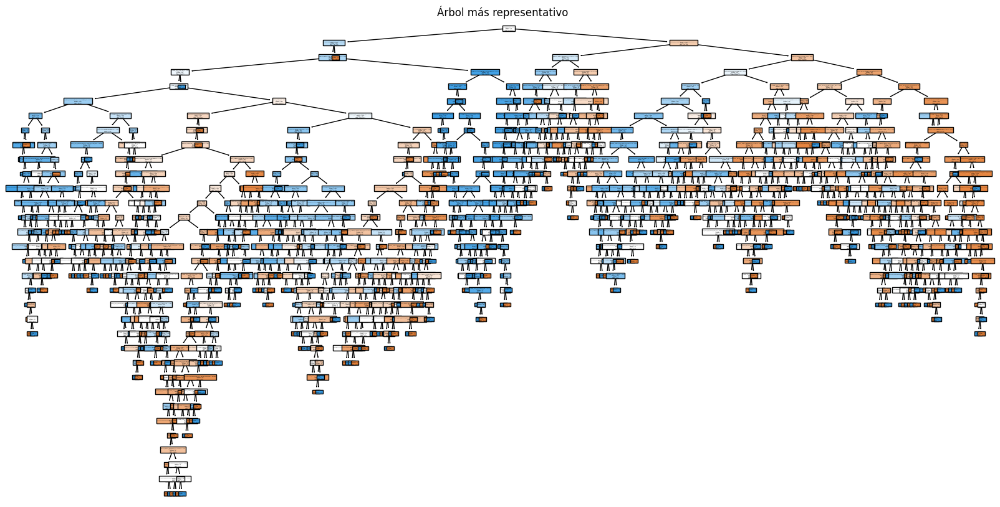

ExtraTreeClassifier(criterion='entropy', max_features='log2',
                    random_state=368880719)

In [ ]:
# Nombre de las características y de las clases
feature_names = X_train.columns 
class_names = ['Clase 0', 'Clase 1']

# Llamo a la funcion para quedarme con el árbol más representativo
get_representative_tree(
    modelo = modelos['Extra Trees'],
    X_test = X_test,
    y_test = y_test,
    feature_names=feature_names,
    class_names=class_names,
    show_rules=True,
    plot=True
)

### Selección de profundidad óptima (para mejorar la interpretabilidad)


Profundidad máxima: 1


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 225 con AUC de 0.648, precsión de 0.813 y exactitud de 0.734

Reglas del árbol más representativo (el 225, con número de muestras incluidas)
|--- hours_in_icu_in_previous_admissions_and_the_current_one <= 598.51 (test samples = 279)
|   |--- class: 1.0 (test samples = 279)
|--- hours_in_icu_in_previous_admissions_and_the_current_one > 598.51 (test samples = 112)
|   |--- class: 0.0 (test samples = 112)


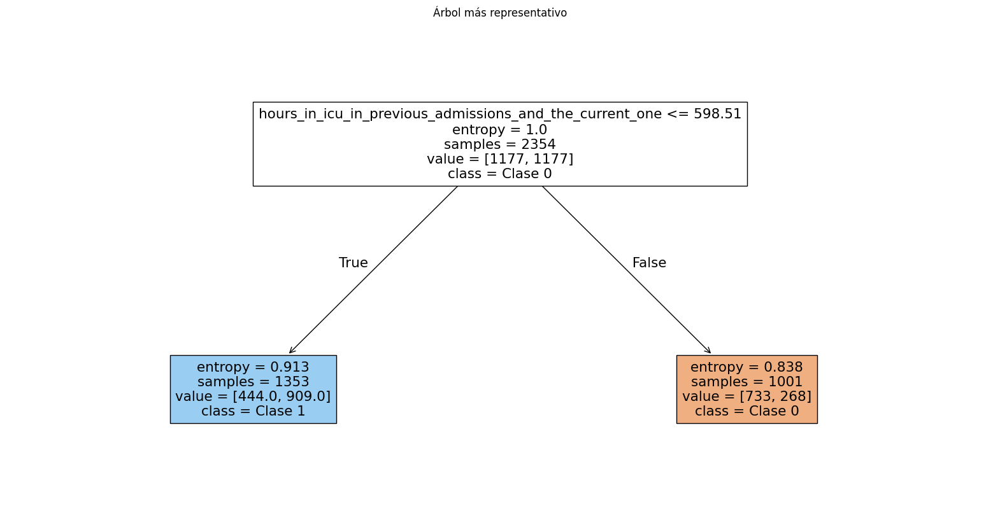


Profundidad máxima: 2


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 851 con AUC de 0.733, precsión de 0.813 y exactitud de 0.734

Reglas del árbol más representativo (el 851, con número de muestras incluidas)
|--- catheter_in_the_current_admission_yes <= 0.37 (test samples = 263)
|   |--- mechanical_ventilation_in_previous_admissions_yes <= 0.21 (test samples = 206)
|   |   |--- class: 1.0 (test samples = 206)
|   |--- mechanical_ventilation_in_previous_admissions_yes > 0.21 (test samples = 57)
|   |   |--- class: 0.0 (test samples = 57)
|--- catheter_in_the_current_admission_yes > 0.37 (test samples = 128)
|   |--- previous_exposure_to_antifungal_agents_yes <= 0.81 (test samples = 99)
|   |   |--- class: 0.0 (test samples = 99)
|   |--- previous_exposure_to_antifungal_agents_yes > 0.81 (test samples = 29)
|   |   |--- class: 0.0 (test samples = 29)


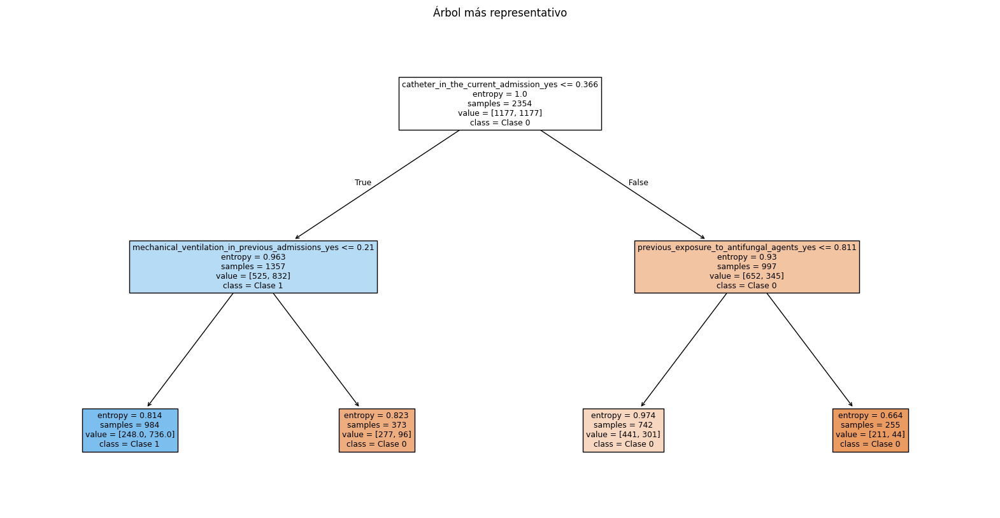


Profundidad máxima: 3


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 375 con AUC de 0.753, precsión de 0.893 y exactitud de 0.639

Reglas del árbol más representativo (el 375, con número de muestras incluidas)
|--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.97 (test samples = 270)
|   |--- catheter_in_the_current_admission_yes <= 0.71 (test samples = 167)
|   |   |--- mechanical_ventilation_in_previous_admissions_yes <= 0.71 (test samples = 132)
|   |   |   |--- class: 1.0 (test samples = 132)
|   |   |--- mechanical_ventilation_in_previous_admissions_yes > 0.71 (test samples = 35)
|   |   |   |--- class: 0.0 (test samples = 35)
|   |--- catheter_in_the_current_admission_yes > 0.71 (test samples = 103)
|   |   |--- number_of_colonizations_in_the_current_admission <= 1.56 (test samples = 3)
|   |   |   |--- class: 1.0 (test samples = 3)
|   |   |--- number_of_colonizations_in_the_current_admission > 1.56 (test samples = 100)
|   |   |   |--- class: 0.0 (test samples = 100)
|--- admission_location_CLINIC REFERRAL/PREMATURE

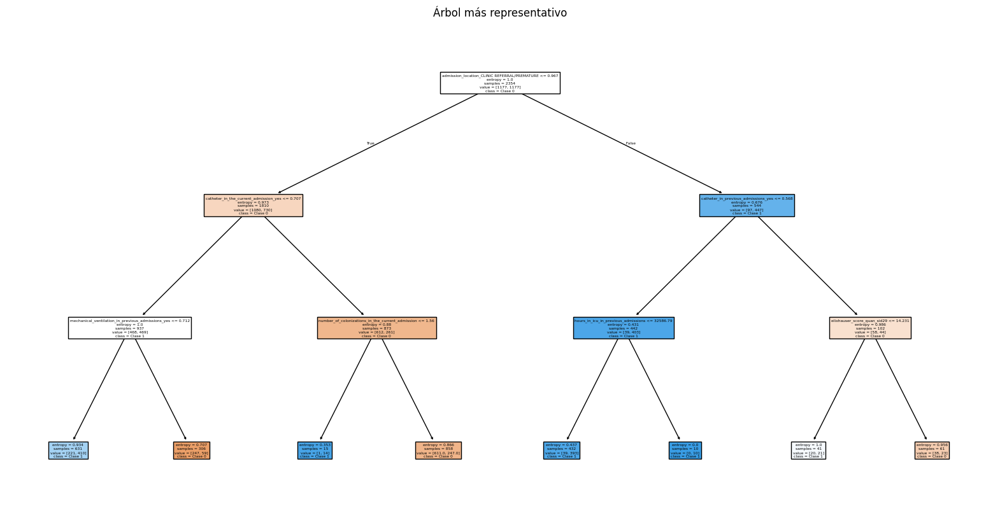


Profundidad máxima: 4


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 417 con AUC de 0.768, precsión de 0.884 y exactitud de 0.685

Reglas del árbol más representativo (el 417, con número de muestras incluidas)
|--- admission_location_EMERGENCY ROOM ADMIT <= 0.01 (test samples = 237)
|   |--- catheter_in_the_current_admission_yes <= 0.11 (test samples = 166)
|   |   |--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.18 (test samples = 70)
|   |   |   |--- mechanical_ventilation_in_previous_admissions_yes <= 0.88 (test samples = 55)
|   |   |   |   |--- class: 1.0 (test samples = 55)
|   |   |   |--- mechanical_ventilation_in_previous_admissions_yes > 0.88 (test samples = 15)
|   |   |   |   |--- class: 0.0 (test samples = 15)
|   |   |--- admission_location_CLINIC REFERRAL/PREMATURE > 0.18 (test samples = 96)
|   |   |   |--- previous_exposure_to_glycopeptides_yes <= 0.52 (test samples = 66)
|   |   |   |   |--- class: 1.0 (test samples = 66)
|   |   |   |--- previous_exposure_to_glycopeptides_yes > 0.52 (test samples = 30)


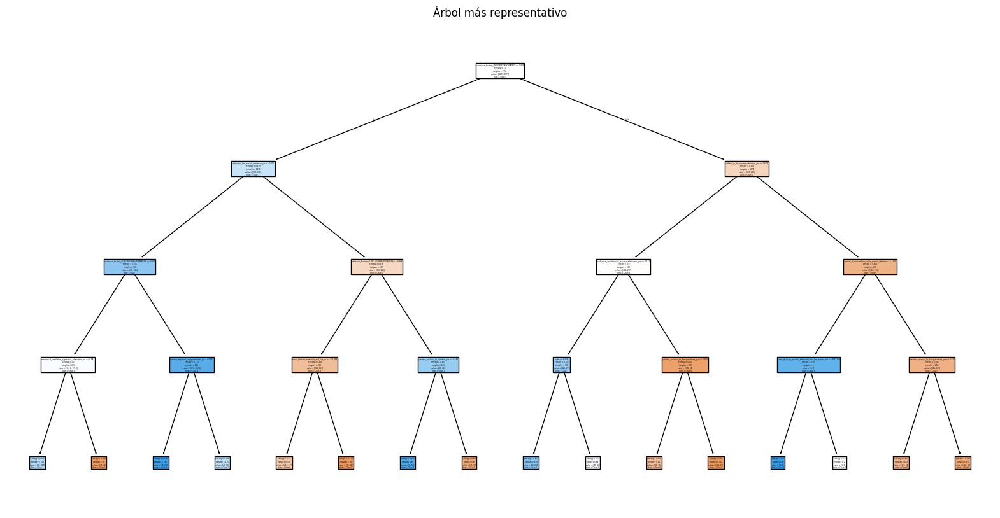


Profundidad máxima: 5


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 373 con AUC de 0.780, precsión de 0.882 y exactitud de 0.708

Reglas del árbol más representativo (el 373, con número de muestras incluidas)
|--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.39 (test samples = 270)
|   |--- readmission_yes <= 0.81 (test samples = 160)
|   |   |--- hours_in_icu_in_previous_admissions_and_the_current_one <= 759.70 (test samples = 142)
|   |   |   |--- mechanical_ventilation_in_the_current_admission_yes <= 0.21 (test samples = 78)
|   |   |   |   |--- sapsii <= 29.88 (test samples = 30)
|   |   |   |   |   |--- class: 1.0 (test samples = 30)
|   |   |   |   |--- sapsii > 29.88 (test samples = 48)
|   |   |   |   |   |--- class: 1.0 (test samples = 48)
|   |   |   |--- mechanical_ventilation_in_the_current_admission_yes > 0.21 (test samples = 64)
|   |   |   |   |--- patient_age <= 85.42 (test samples = 57)
|   |   |   |   |   |--- class: 1.0 (test samples = 57)
|   |   |   |   |--- patient_age > 85.42 (test samples = 7)
|   

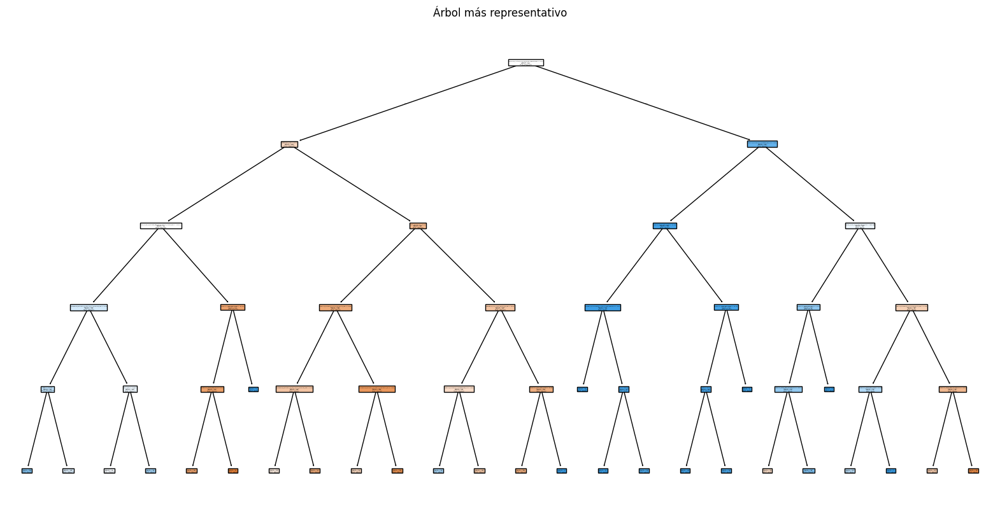


Profundidad máxima: 6


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 698 con AUC de 0.794, precsión de 0.865 y exactitud de 0.660

Reglas del árbol más representativo (el 698, con número de muestras incluidas)
|--- patient_gender_M <= 0.13 (test samples = 169)
|   |--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.89 (test samples = 110)
|   |   |--- previous_exposure_to_fluorquinolones_yes <= 0.45 (test samples = 78)
|   |   |   |--- mechanical_ventilation_in_the_current_admission_yes <= 0.35 (test samples = 43)
|   |   |   |   |--- readmission_yes <= 0.73 (test samples = 32)
|   |   |   |   |   |--- sapsii <= 21.05 (test samples = 5)
|   |   |   |   |   |   |--- class: 1.0 (test samples = 5)
|   |   |   |   |   |--- sapsii > 21.05 (test samples = 27)
|   |   |   |   |   |   |--- class: 1.0 (test samples = 27)
|   |   |   |   |--- readmission_yes > 0.73 (test samples = 11)
|   |   |   |   |   |--- catheter_in_previous_admissions_yes <= 0.21 (test samples = 7)
|   |   |   |   |   |   |--- class: 1.0 (test samples = 7)
|   |

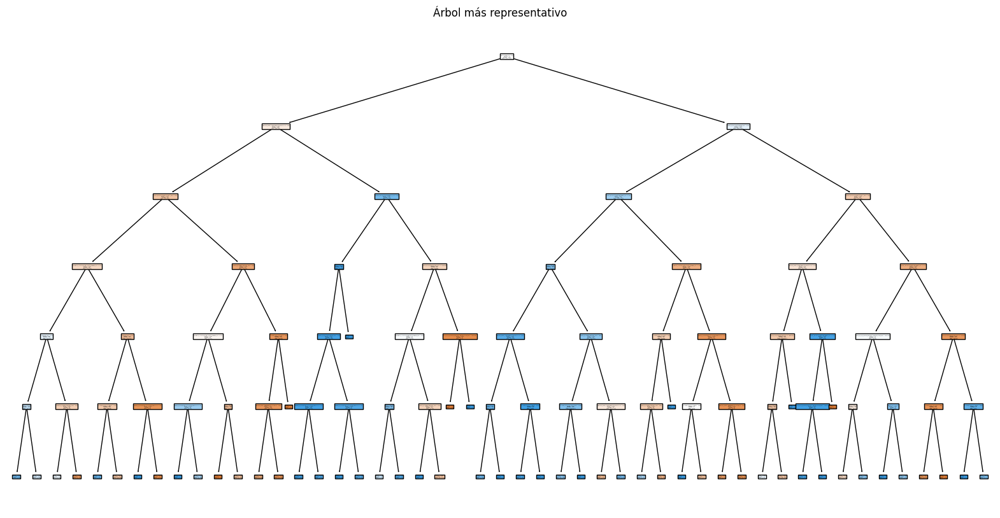


Profundidad máxima: 7


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 99 con AUC de 0.786, precsión de 0.880 y exactitud de 0.714

Reglas del árbol más representativo (el 99, con número de muestras incluidas)
|--- mechanical_ventilation_in_previous_admissions_yes <= 0.71 (test samples = 305)
|   |--- elixhauser_score_quan_vanwalraven <= 40.52 (test samples = 304)
|   |   |--- number_of_colonizations_in_the_current_admission <= 1.31 (test samples = 27)
|   |   |   |--- qsofa <= 1.54 (test samples = 12)
|   |   |   |   |--- mechanical_ventilation_in_the_current_admission_yes <= 0.28 (test samples = 11)
|   |   |   |   |   |--- previous_exposure_to_fluorquinolones_yes <= 0.96 (test samples = 9)
|   |   |   |   |   |   |--- class: 1.0 (test samples = 9)
|   |   |   |   |   |--- previous_exposure_to_fluorquinolones_yes > 0.96 (test samples = 2)
|   |   |   |   |   |   |--- patient_age <= 75.33 (test samples = 1)
|   |   |   |   |   |   |   |--- class: 1.0 (test samples = 1)
|   |   |   |   |   |   |--- patient_age > 75.33 (test sampl

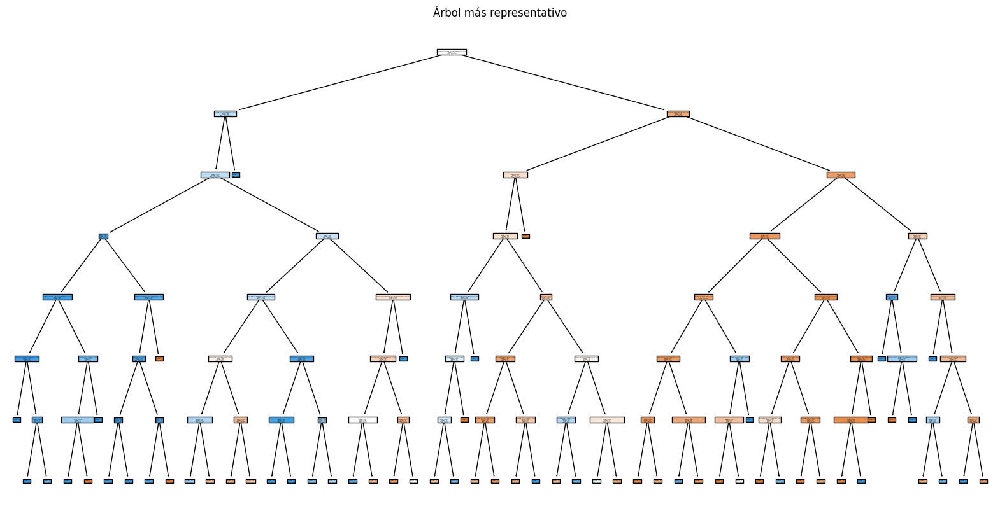


Profundidad máxima: 8


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 488 con AUC de 0.791, precsión de 0.888 y exactitud de 0.706

Reglas del árbol más representativo (el 488, con número de muestras incluidas)
|--- previous_exposure_to_antifungal_agents_yes <= 0.39 (test samples = 329)
|   |--- catheter_in_the_current_admission_yes <= 0.04 (test samples = 230)
|   |   |--- sofa <= 5.13 (test samples = 163)
|   |   |   |--- patient_age <= 38.17 (test samples = 10)
|   |   |   |   |--- mechanical_ventilation_in_the_current_admission_yes <= 0.12 (test samples = 10)
|   |   |   |   |   |--- previous_exposure_to_glycopeptides_yes <= 0.05 (test samples = 9)
|   |   |   |   |   |   |--- elixhauser_score_quan_sid29 <= 2.19 (test samples = 4)
|   |   |   |   |   |   |   |--- patient_age <= 21.13 (test samples = 0)
|   |   |   |   |   |   |   |   |--- class: 1.0 (test samples = 0)
|   |   |   |   |   |   |   |--- patient_age > 21.13 (test samples = 4)
|   |   |   |   |   |   |   |   |--- class: 1.0 (test samples = 4)
|   |   |   |   |   

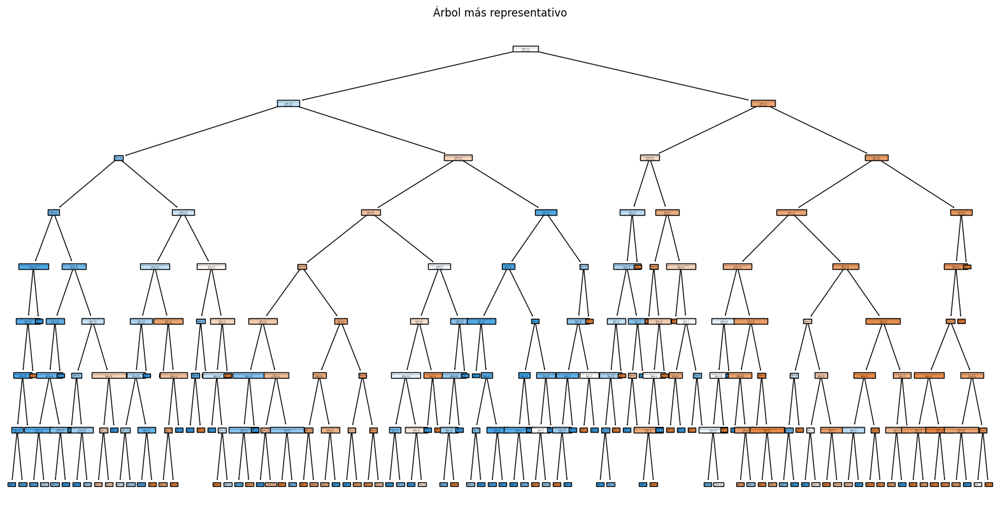


Profundidad máxima: 9


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 57 con AUC de 0.805, precsión de 0.863 y exactitud de 0.652

Reglas del árbol más representativo (el 57, con número de muestras incluidas)
|--- number_of_colonizations_in_the_current_admission <= 2.39 (test samples = 62)
|   |--- mechanical_ventilation_in_previous_admissions_yes <= 0.09 (test samples = 51)
|   |   |--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.08 (test samples = 33)
|   |   |   |--- catheter_in_previous_admissions_yes <= 0.08 (test samples = 32)
|   |   |   |   |--- elixhauser_score_quan_vanwalraven <= 4.28 (test samples = 18)
|   |   |   |   |   |--- elixhauser_score_ahrq_sid30 <= 2.17 (test samples = 16)
|   |   |   |   |   |   |--- number_of_colonizations_in_the_current_admission <= 1.72 (test samples = 9)
|   |   |   |   |   |   |   |--- admission_location_EMERGENCY ROOM ADMIT <= 0.96 (test samples = 5)
|   |   |   |   |   |   |   |   |--- class: 1.0 (test samples = 5)
|   |   |   |   |   |   |   |--- admission_location_EMERGENCY R

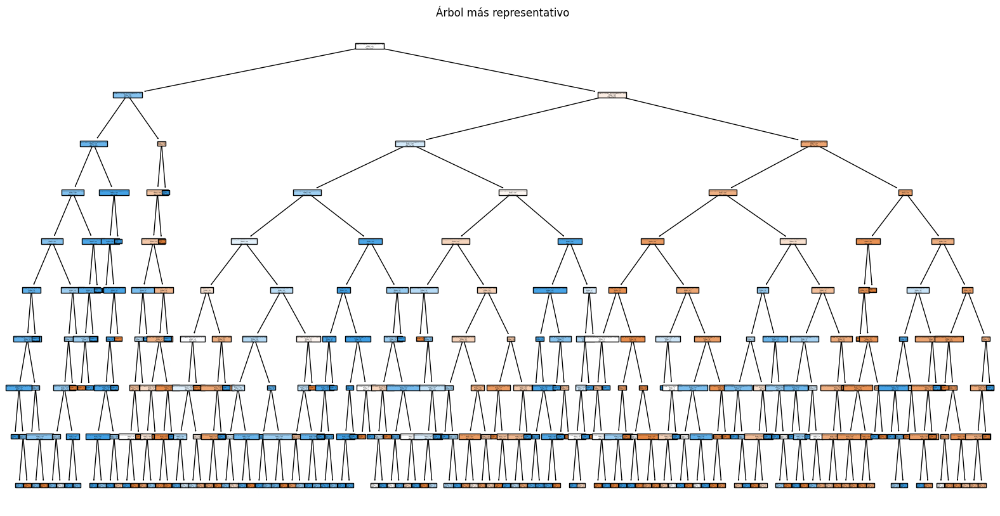


Profundidad máxima: 10


/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/lib/python3.11/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/Users/nicofernandez/TFM/Bahía/Bahía/TFM/TFM sí/Código/TFM/l

Árbol más representativo: 508 con AUC de 0.797, precsión de 0.850 y exactitud de 0.685

Reglas del árbol más representativo (el 508, con número de muestras incluidas)
|--- catheter_in_previous_admissions_yes <= 0.12 (test samples = 324)
|   |--- apsiii <= 67.50 (test samples = 264)
|   |   |--- admission_location_CLINIC REFERRAL/PREMATURE <= 0.29 (test samples = 183)
|   |   |   |--- catheter_in_the_current_admission_yes <= 0.14 (test samples = 129)
|   |   |   |   |--- previous_exposure_to_antifungal_agents_yes <= 0.56 (test samples = 121)
|   |   |   |   |   |--- admission_location_EMERGENCY ROOM ADMIT <= 0.41 (test samples = 52)
|   |   |   |   |   |   |--- number_of_colonizations_in_the_current_admission <= 1.22 (test samples = 10)
|   |   |   |   |   |   |   |--- mechanical_ventilation_in_the_current_admission_yes <= 0.28 (test samples = 10)
|   |   |   |   |   |   |   |   |--- class: 1.0 (test samples = 10)
|   |   |   |   |   |   |   |--- mechanical_ventilation_in_the_current_ad

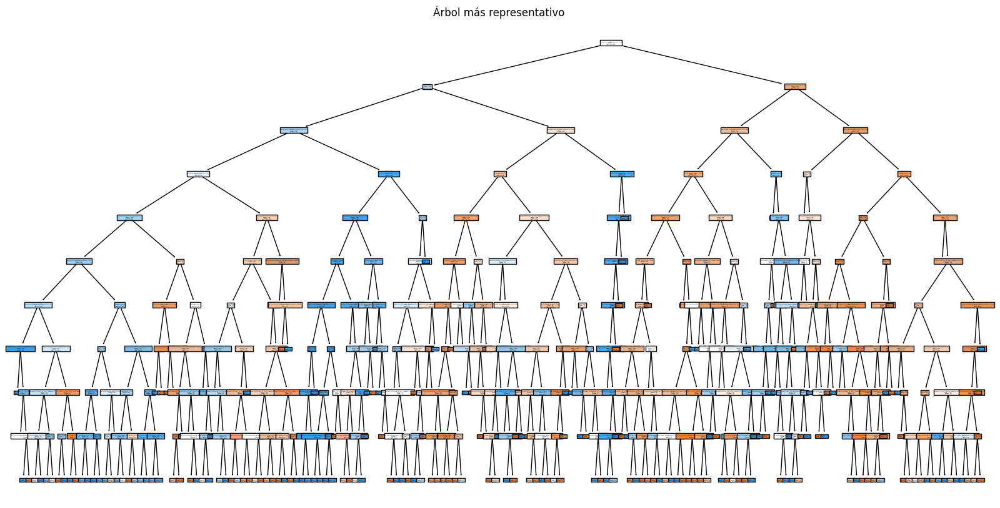

In [ ]:
# Probando con con qué profundidad quedarme para mejorar la interpretabilidad
for depth in range(1,11):
    print(f'\nProfundidad máxima: {depth}')

    clf = ExtraTreesClassifier(random_state=789, n_estimators=1000, max_depth=depth, criterion='entropy', bootstrap=False, max_features='log2')
    clf.fit(X_train, y_train)
    get_representative_tree(
        modelo = clf,
        X_test = X_test,
        y_test = y_test,
        feature_names=feature_names,
        class_names=class_names,
        show_rules=True,
        plot=True
    )

### Forma de representar los fenotipos más intuitiva
Seleccionando el árbol de decisión Extra Tree de profundidad 6 (árbol 307), el cual cuenta con un AUC: 0.790, Precisión: 0.882, y Exactitud: 0.691, se dan un total de 42 fenotipos. 

De estos 42 fenotipos se eliminan aquellos cuyo última condición dea el mismo resultado. Por ejemplo, si una rama es 1 y la otra es 0 pero ambas dan lugar a clase 0, se eliminan esa última condición, nos quedamos con solo una clase. Con esta reducción, el número de fenotipos para a 30. 

Por último, se eliminan también aquellos caminos cuya última clase esté formada por 5 muestras o menos, por no considerarse representativa. Así el número de fenotipos pasa a ser de 15 para SARM

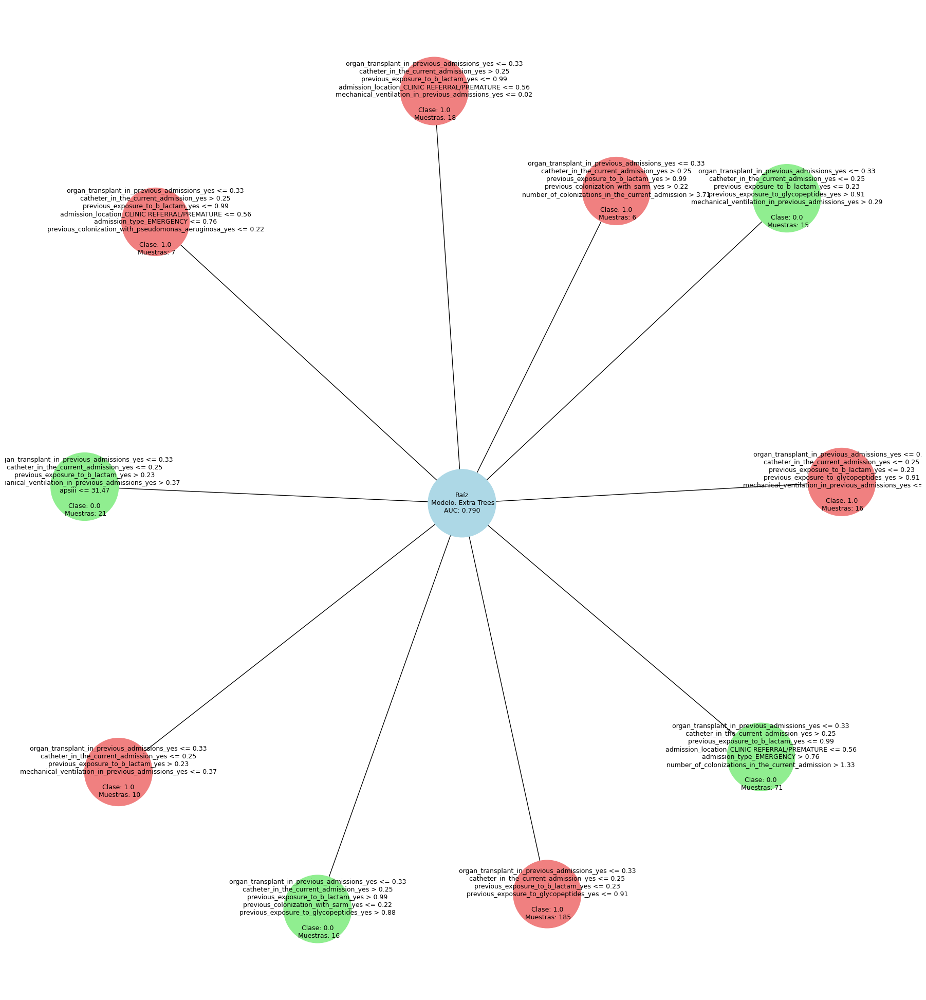

In [ ]:
# Creo un grafo dirigido
G = nx.DiGraph()
# Nodos hoja con sus condiciones acumuladas
nodes = {
    "N1": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes <= 0.25\nprevious_exposure_to_b_lactam_yes <= 0.23\nprevious_exposure_to_glycopeptides_yes <= 0.91\n\nClase: 1.0\n Muestras: 185"
    },
    "N2": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes <= 0.25\nprevious_exposure_to_b_lactam_yes <= 0.23\nprevious_exposure_to_glycopeptides_yes > 0.91\nmechanical_ventilation_in_previous_admissions_yes <= 0.29\n\nClase: 1.0\n Muestras: 16"
    },
    "N3": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes <= 0.25\nprevious_exposure_to_b_lactam_yes <= 0.23\nprevious_exposure_to_glycopeptides_yes > 0.91\nmechanical_ventilation_in_previous_admissions_yes > 0.29\n\nClase: 0.0\n Muestras: 15"
    },
    "N4": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes <= 0.25\nprevious_exposure_to_b_lactam_yes > 0.23\nmechanical_ventilation_in_previous_admissions_yes <= 0.37\n\nClase: 1.0\n Muestras: 10"
    },
    "N5": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes <= 0.25\nprevious_exposure_to_b_lactam_yes > 0.23\nmechanical_ventilation_in_previous_admissions_yes > 0.37\napsiii <= 31.47\n\nClase: 0.0\n Muestras: 21"
    },
    "N6": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes > 0.25\nprevious_exposure_to_b_lactam_yes <= 0.99\nadmission_location_CLINIC REFERRAL/PREMATURE <= 0.56\nadmission_type_EMERGENCY <= 0.76\nprevious_colonization_with_pseudomonas_aeruginosa_yes <= 0.22\n\nClase: 1.0\n Muestras: 7"
    },
    "N7": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes > 0.25\nprevious_exposure_to_b_lactam_yes <= 0.99\nadmission_location_CLINIC REFERRAL/PREMATURE <= 0.56\nadmission_type_EMERGENCY > 0.76\nnumber_of_colonizations_in_the_current_admission > 1.33\n\nClase: 0.0\n Muestras: 71"
    },
    "N8": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes > 0.25\nprevious_exposure_to_b_lactam_yes <= 0.99\nadmission_location_CLINIC REFERRAL/PREMATURE <= 0.56\nmechanical_ventilation_in_previous_admissions_yes <= 0.02\n\nClase: 1.0\n Muestras: 18"
    },
    "N9": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes > 0.25\nprevious_exposure_to_b_lactam_yes > 0.99\nprevious_colonization_with_sarm_yes <= 0.22\nprevious_exposure_to_glycopeptides_yes > 0.88\n\nClase: 0.0\n Muestras: 16"
    },
    "N10": {
        "text": "organ_transplant_in_previous_admissions_yes <= 0.33\ncatheter_in_the_current_admission_yes > 0.25\nprevious_exposure_to_b_lactam_yes > 0.99\nprevious_colonization_with_sarm_yes > 0.22\nnumber_of_colonizations_in_the_current_admission > 3.71\n\nClase: 1.0\n Muestras: 6"
    },
    
}

# Tengo que añadir estos nodos al grafo
for node_id, node_data in nodes.items():
    G.add_node(node_id, label=node_data['text'])

# Hago las conexiones ocn la raíz
edges =[]
for nid in nodes:
    edges.append(('root', nid))
G.add_node('root', label = 'Raíz\n Modelo: Extra Trees\nAUC: 0.790')
G.add_edges_from(edges)

# Posición de los nodos alrededor de la raíz
pos = nx.spring_layout(G, seed=789, k=0.2)

# Colores según la clase
node_colors = []
for node in G.nodes():
    if node == 'root':
        node_colors.append('lightblue')
    else:
        label = G.nodes[node].get('label', '')
        if 'Clase: 1.0' in label:
            node_colors.append('lightcoral')
        else:
            node_colors.append('lightgreen')

# Dibujo los nodos
plt.figure(figsize=(23,25))
nx.draw_networkx_edges(G,pos,arrows=True)
nx.draw_networkx_nodes(G, pos, node_size=9000, node_color=node_colors, node_shape="o")
labels= nx.get_node_attributes(G, 'label')
nx.draw_networkx_labels(G, pos, labels, font_size=9)
plt.axis('off')
plt.show()

Reduciendo los caminos que conducen a la misma etiqueta (la pureza es la que hace dividir el árbol)

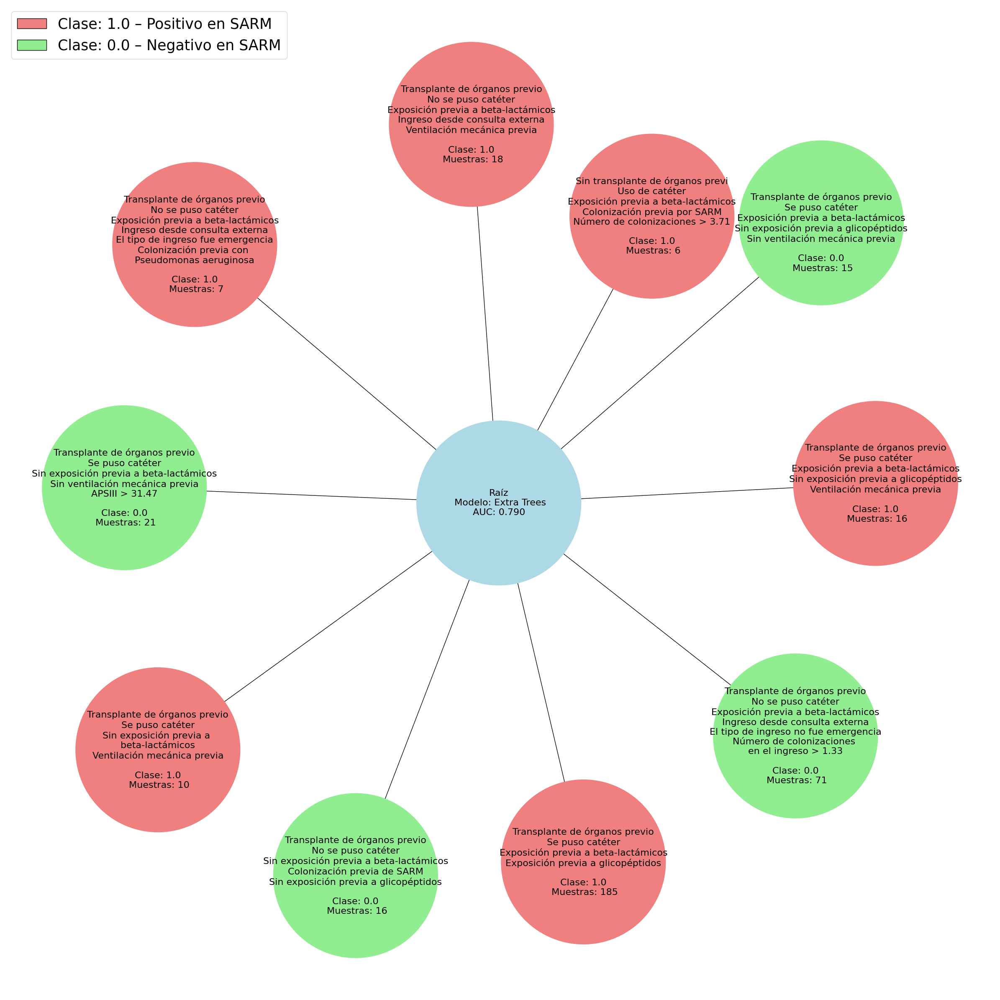

In [ ]:
# Creo un grafo dirigido
G = nx.DiGraph()
# Nodos hoja con sus condiciones acumuladas
nodes = {
    "N1": {
        "text": "Transplante de órganos previo\nSe puso catéter\nExposición previa a beta-lactámicos\nExposición previa a glicopéptidos\n\nClase: 1.0\n Muestras: 185"
    },
    "N2": {
        "text": "Transplante de órganos previo\nSe puso catéter\nExposición previa a beta-lactámicos\nSin exposición previa a glicopéptidos\nVentilación mecánica previa\n\nClase: 1.0\n Muestras: 16"
    },
    "N3": {
        "text": "\n\nTransplante de órganos previo\nSe puso catéter\nExposición previa a beta-lactámicos\nSin exposición previa a glicopéptidos\nSin ventilación mecánica previa\n\nClase: 0.0\n Muestras: 15"
    },
    "N4": {
        "text": "Transplante de órganos previo\nSe puso catéter\nSin exposición previa a \nbeta-lactámicos\nVentilación mecánica previa\n\nClase: 1.0\n Muestras: 10"
    },

    "N5": {
        "text": "Transplante de órganos previo\nSe puso catéter\nSin exposición previa a beta-lactámicos\nSin ventilación mecánica previa\nAPSIII > 31.47\n\nClase: 0.0\n Muestras: 21"
    },
    "N6": {
        "text": "Transplante de órganos previo\nNo se puso catéter\nExposición previa a beta-lactámicos\nIngreso desde consulta externa\nEl tipo de ingreso fue emergencia\nColonización previa con \nPseudomonas aeruginosa\n\nClase: 1.0\n Muestras: 7"
    },

    "N7": {
        "text": "Transplante de órganos previo\nNo se puso catéter\nExposición previa a beta-lactámicos\nIngreso desde consulta externa\nEl tipo de ingreso no fue emergencia\nNúmero de colonizaciones \nen el ingreso > 1.33\n\nClase: 0.0\n Muestras: 71"
    },
    "N8": {
        "text": "Transplante de órganos previo\nNo se puso catéter\nExposición previa a beta-lactámicos\nIngreso desde consulta externa\nVentilación mecánica previa\n\nClase: 1.0\n Muestras: 18"
    },
    "N9": {
        "text": "Transplante de órganos previo\nNo se puso catéter\nSin exposición previa a beta-lactámicos\nColonización previa de SARM\nSin exposición previa a glicopéptidos\n\nClase: 0.0\n Muestras: 16"
    },
    "N13": {
        "text": "Sin transplante de órganos previ\nUso de catéter\nExposición previa a beta-lactámicos\nColonización previa por SARM\nNúmero de colonizaciones > 3.71\n\nClase: 1.0\n Muestras: 6"
    },
    
}

# Tengo que añadir estos nodos al grafo
for node_id, node_data in nodes.items():
    G.add_node(node_id, label=node_data['text'])

# Hago las conexiones ocn la raíz
edges =[]
for nid in nodes:
    edges.append(('root', nid))
G.add_node('root', label = 'Raíz\n Modelo: Extra Trees\nAUC: 0.790')
G.add_edges_from(edges)

# Posición de los nodos alrededor de la raíz
pos = nx.spring_layout(G, seed=789, k=0.2)

# Colores según la clase
node_colors = []
for node in G.nodes():
    if node == 'root':
        node_colors.append('lightblue')
    else:
        label = G.nodes[node].get('label', '')
        if 'Clase: 1.0' in label:
            node_colors.append('lightcoral')
        else:
            node_colors.append('lightgreen')

# Dibujo los nodos
plt.figure(figsize=(24,24))
nx.draw_networkx_edges(G,pos,arrows=True)
nx.draw_networkx_nodes(G, pos, node_size=80000, node_color=node_colors, node_shape="o")
labels= nx.get_node_attributes(G, 'label')
nx.draw_networkx_labels(G, pos, labels, font_size=16)
plt.axis('off')
plt.margins(0.1)
plt.tight_layout()

# Definir colores de clase
legend_elements = [
    Patch(facecolor='lightcoral', edgecolor='k', label='Clase: 1.0 – Positivo en SARM'),
    Patch(facecolor='lightgreen', edgecolor='k', label='Clase: 0.0 – Negativo en SARM'),
]

# Añadir leyenda a la gráfica
plt.legend(handles=legend_elements, loc='upper left', fontsize=25, frameon=True)
plt.show()